# Libreries

In [1]:
import os
import random
import shutil
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2

import torch
import torch.nn as nn
from torch.optim import SGD, AdamW
from torch.utils.data import DataLoader, Dataset, random_split, ConcatDataset
from pytorch_lightning.callbacks import EarlyStopping
import torchvision
from torchsummary import summary

from torchvision import transforms
from torchvision.utils import make_grid

import pytorch_lightning as pl

from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim

import warnings

# Disabilita tutti i warning
warnings.filterwarnings("ignore")

device = "cuda" if torch.cuda.is_available() else "cpu"

In [2]:
def show_image(image_path):
    img = mpimg.imread(image_path)
    plt.imshow(img)
    plt.axis('off')  # Rimuove gli assi dall'immagine
    plt.show()

# Data preprocessing

In [3]:
import os
from PIL import Image
import torchvision.transforms.functional as F

class PadIfNeeded:
    def __init__(self, min_size, padding_mode='constant'):
        self.min_size = min_size
        self.padding_mode = padding_mode

    def __call__(self, img):
        # Calculate padding if needed
        padding_left = max(0, (self.min_size[0] - img.size[0]) // 2)
        padding_right = max(0, self.min_size[0] - img.size[0] - padding_left)
        padding_top = max(0, (self.min_size[1] - img.size[1]) // 2)
        padding_bottom = max(0, self.min_size[1] - img.size[1] - padding_top)
        
        # Apply padding
        img = F.pad(img, (padding_left, padding_top, padding_right, padding_bottom), padding_mode=self.padding_mode)
        return img

def process_and_save_images(input_folder, output_folder, transform):
    # Create the output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)
    
    # Iterate through all images in the input folder
    for filename in os.listdir(input_folder):
        if filename.endswith((".png", ".jpg", ".jpeg")):
            # Open the image
            img_path = os.path.join(input_folder, filename)
            image = Image.open(img_path).convert("RGB")
            
            # Apply the transformation
            transformed_image = transform(image)
            
            # Save the transformed image to the output folder
            output_path = os.path.join(output_folder, filename)
            transformed_image.save(output_path)
            print(f"Saved transformed image to {output_path}")

def resize_images(input_folder, output_folder, size=(256, 256)):
    # Create the output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)
    
    # Iterate through all images in the input folder
    for filename in os.listdir(input_folder):
        if filename.endswith((".png", ".jpg", ".jpeg")):
            # Open the image
            img_path = os.path.join(input_folder, filename)
            image = Image.open(img_path).convert("RGB")
            
            # Resize the image
            resized_image = image.resize(size)
            
            # Save the resized image to the output folder
            output_path = os.path.join(output_folder, filename)
            resized_image.save(output_path)
            print(f"Saved resized image to {output_path}")


In [4]:
# def verify_images(dataset):
#     images = os.listdir(dataset)
#     for img in images:
#         img_path = os.path.join(dataset, img)
#         try:
#             with Image.open(img_path) as img_file:
#                 img_file.verify()
#         except (IOError, SyntaxError) as e:
#             print(f"Corrupted image file: {img_path}")

# # Use the function
# verify_images("Flickr2K_Padded")

In [5]:
# # Define the padding transformation
# pad_transform = PadIfNeeded(min_size=(2048, 2048))

# # Process the images in the "Flickr2K" folder and save them to a new folder "Flickr2K_Padded"
# process_and_save_images("Flickr2K", "Flickr2K_Padded", pad_transform)

# # Resize the padded images to 256x256 and save them to "Flickr2K_Padded_Resized"
# resize_images("Flickr2K_Padded", "Flickr256_Padded", size=(256, 256))

In [6]:
# resize_images("Flickr256_Padded", "Flickr64_Padded", size=(64, 64))

# Utility functions

In [3]:
def calculate_psnr(image1, image2):
    # Convert images to numpy arrays and scale to [0, 1]
    image1_np = image1.cpu().numpy().transpose(1, 2, 0)
    image2_np = image2.cpu().numpy().transpose(1, 2, 0)
    image1_np = (image1_np - image1_np.min()) / (image1_np.max() - image1_np.min())
    image2_np = (image2_np - image2_np.min()) / (image2_np.max() - image2_np.min())

    return psnr(image1_np, image2_np, data_range=1.0)

def calculate_ssim(image1, image2):
    # Convert images to numpy arrays and scale to [0, 1]
    image1_np = image1.cpu().numpy().transpose(1, 2, 0)
    image2_np = image2.cpu().numpy().transpose(1, 2, 0)
    image1_np = (image1_np - image1_np.min()) / (image1_np.max() - image1_np.min())
    image2_np = (image2_np - image2_np.min()) / (image2_np.max() - image2_np.min())

    return ssim(image1_np, image2_np, data_range=1.0, multichannel=True, win_size=3, channel_axis=-1)

def show_images(model, original_size, scaled_size):
    titles = ['Sr Images', 'Input Images', 'Reconstructed Images']
    image_groups = [model.validation_results['original'],
                    model.validation_results['inputs'],
                    model.validation_results['outputs']]

    Sr_images = model.validation_results['original']
    input_images = model.validation_results['inputs']
    reconstructed_images = model.validation_results['outputs']

    # Calculate PSNR and SSIM
    psnr_reconstructed = np.mean([calculate_psnr(Sr, reconstructed) for Sr, reconstructed in zip(Sr_images, reconstructed_images)])

    ssim_reconstructed = np.mean([calculate_ssim(Sr, reconstructed) for Sr, reconstructed in zip(Sr_images, reconstructed_images)])

    print(f"Average PSNR between Sr and reconstructed images: {psnr_reconstructed:.2f} dB")
    print(f"Average SSIM between Sr and reconstructed images: {ssim_reconstructed:.4f}")

    for images, title in zip(image_groups, titles):
        if title == 'Input Images':
            size = scaled_size
        else:
            size = original_size
        
        images = torchvision.utils.make_grid(images.view(-1, 3, size, size)[:5, ...], nrow=5, normalize=True)
        images_np = images.permute(1, 2, 0).cpu().numpy()

        plt.figure(figsize=(15, 15))
        plt.title(title)
        plt.imshow(images_np)
        plt.axis('off')
        plt.show()

In [4]:
class ImageDataset(Dataset):
    def __init__(self, dataset_sr_dir, dataset_lr_dir, transform_original=None, transform_rescaled=None):
        self.dataset_sr_dir = dataset_sr_dir
        self.dataset_lr_dir = dataset_lr_dir
        
        self.transform_original = transform_original
        self.transform_rescaled = transform_rescaled
        
        self.images_sr = os.listdir(dataset_sr_dir)
        self.images_lr = os.listdir(dataset_lr_dir)
        
    def __len__(self):
        return len(self.images_sr)

    def __getitem__(self, idx):
        img_sr_path = os.path.join(self.dataset_sr_dir, self.images_sr[idx])
        img_lr_path = os.path.join(self.dataset_lr_dir, self.images_lr[idx])
        
        try:
            original_image = Image.open(img_sr_path).convert("RGB")
            rescaled_image = Image.open(img_lr_path).convert("RGB")
            
        except OSError:
            print(f"Skipping corrupted image: {img_sr_path}")
            return self.__getitem__((idx + 1) % len(self.images))
        
        if self.transform_original:
            original_image = self.transform_original(original_image)
        
        if self.transform_rescaled:
            rescaled_image = self.transform_rescaled(rescaled_image)

        return rescaled_image, original_image

# Experiments

## Data loader

In [5]:
def set_seed(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Imposta il seed per rendere l'esperimento ripetibile
seed = 42
set_seed(seed)

original_size = 256

scaled_size = 64

dataset_sr_dir = "Flickr256_Padded"

dataset_lr_dir = "Flickr64_Padded"

# Creazione del dataset
dataset = ImageDataset(dataset_sr_dir,
                       dataset_lr_dir,
                       transform_original=transforms.Compose([
                            transforms.ToTensor()
                        ]),
                       transform_rescaled=transforms.Compose([
                            transforms.ToTensor()
                        ]))

# Suddivisione del dataset in train e validation set (80% train, 20% val)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=torch.Generator().manual_seed(seed))

# Creazione dei dataloader per train e val
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=32, shuffle=False)

## Experiment 1

In [10]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 8, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.Conv2d(8, 16, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.AvgPool2d(kernel_size=2, stride=2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(32, 16, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.ConvTranspose2d(16, 8, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.ConvTranspose2d(8, 3, 3, stride=2, padding=1, output_padding=1),
        )
        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr = 1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr 
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v1.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3050 Ti Laptop GPU') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 6.0 K 
1 | decoder   | Sequential | 6.0 K 
2 | criterion | MSELoss    | 0     
-----------------------------------------
12.0 K    Trainable params
0         Non-trainable params
12.0 K    Total params
0.048     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]                                
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 8, 128, 128]             224
              SiLU-2          [-1, 8, 128, 128]               0
            Conv2d-3         [-1, 16, 128, 128]           1,168
              SiLU-4         [-1, 16, 128, 128]               0
         AvgPool2d-5           [-1, 16, 64, 64]               0
            Conv2d-6           [-1, 32, 64, 64]           4,640
              SiLU-7           [-1, 32, 64, 64]               0
   ConvTranspose2d-8         [-1, 16, 128, 128]           4,624
              SiLU-9         [-1, 16, 128, 128]               0
  ConvTranspose2d-10          [-1, 8, 256, 256]           1,160
             SiLU-11          [-1, 8, 256, 256]               0
  ConvTranspose2d-12          [-1, 3, 512, 512]             219
Total params: 12,035
Traina

Metric val/loss improved. New best score: 0.204


Epoch 2: 100%|██████████| 34/34 [00:10<00:00,  3.24it/s, v_num=28, train/loss_step=0.166, val/loss_step=0.209, val/loss_epoch=0.193, train/loss_epoch=0.199]

Metric val/loss improved by 0.011 >= min_delta = 0.005. New best score: 0.193


Epoch 3: 100%|██████████| 34/34 [00:10<00:00,  3.34it/s, v_num=28, train/loss_step=0.168, val/loss_step=0.187, val/loss_epoch=0.172, train/loss_epoch=0.187]

Metric val/loss improved by 0.021 >= min_delta = 0.005. New best score: 0.172


Epoch 4: 100%|██████████| 34/34 [00:10<00:00,  3.22it/s, v_num=28, train/loss_step=0.140, val/loss_step=0.138, val/loss_epoch=0.127, train/loss_epoch=0.153]

Metric val/loss improved by 0.045 >= min_delta = 0.005. New best score: 0.127


Epoch 5: 100%|██████████| 34/34 [00:10<00:00,  3.29it/s, v_num=28, train/loss_step=0.105, val/loss_step=0.101, val/loss_epoch=0.0933, train/loss_epoch=0.111]

Metric val/loss improved by 0.034 >= min_delta = 0.005. New best score: 0.093


Epoch 6: 100%|██████████| 34/34 [00:10<00:00,  3.24it/s, v_num=28, train/loss_step=0.0802, val/loss_step=0.0743, val/loss_epoch=0.0694, train/loss_epoch=0.0819]

Metric val/loss improved by 0.024 >= min_delta = 0.005. New best score: 0.069


Epoch 7: 100%|██████████| 34/34 [00:10<00:00,  3.29it/s, v_num=28, train/loss_step=0.0579, val/loss_step=0.0572, val/loss_epoch=0.0541, train/loss_epoch=0.0621]

Metric val/loss improved by 0.015 >= min_delta = 0.005. New best score: 0.054


Epoch 8: 100%|██████████| 34/34 [00:10<00:00,  3.30it/s, v_num=28, train/loss_step=0.0414, val/loss_step=0.0462, val/loss_epoch=0.0442, train/loss_epoch=0.0495]

Metric val/loss improved by 0.010 >= min_delta = 0.005. New best score: 0.044


Epoch 9: 100%|██████████| 34/34 [00:10<00:00,  3.26it/s, v_num=28, train/loss_step=0.0416, val/loss_step=0.0394, val/loss_epoch=0.038, train/loss_epoch=0.0414] 

Metric val/loss improved by 0.006 >= min_delta = 0.005. New best score: 0.038


Epoch 11: 100%|██████████| 34/34 [00:09<00:00,  3.43it/s, v_num=28, train/loss_step=0.0293, val/loss_step=0.0327, val/loss_epoch=0.0319, train/loss_epoch=0.0333]

Metric val/loss improved by 0.006 >= min_delta = 0.005. New best score: 0.032


Epoch 17: 100%|██████████| 34/34 [00:10<00:00,  3.33it/s, v_num=28, train/loss_step=0.0278, val/loss_step=0.0273, val/loss_epoch=0.0269, train/loss_epoch=0.0275]

Metric val/loss improved by 0.005 >= min_delta = 0.005. New best score: 0.027


Epoch 25: 100%|██████████| 34/34 [00:10<00:00,  3.22it/s, v_num=28, train/loss_step=0.0218, val/loss_step=0.0218, val/loss_epoch=0.0218, train/loss_epoch=0.0223]

Metric val/loss improved by 0.005 >= min_delta = 0.005. New best score: 0.022


Epoch 35: 100%|██████████| 34/34 [00:10<00:00,  3.19it/s, v_num=28, train/loss_step=0.0204, val/loss_step=0.0179, val/loss_epoch=0.0182, train/loss_epoch=0.0184]

Monitored metric val/loss did not improve in the last 10 records. Best score: 0.022. Signaling Trainer to stop.


Epoch 35: 100%|██████████| 34/34 [00:10<00:00,  3.18it/s, v_num=28, train/loss_step=0.0204, val/loss_step=0.0179, val/loss_epoch=0.0182, train/loss_epoch=0.0184]


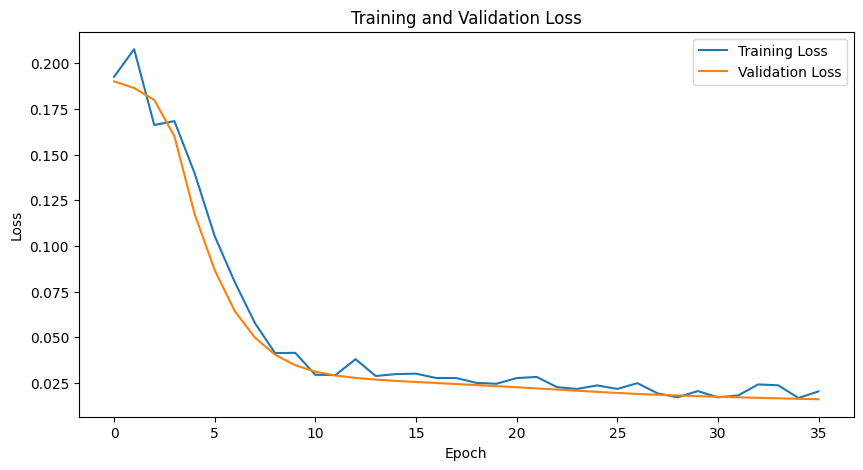

Average PSNR between Sr and reconstructed images: 15.20 dB
Average SSIM between Sr and reconstructed images: 0.2254


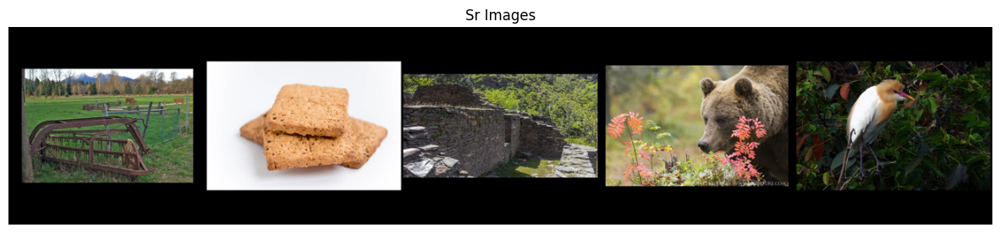

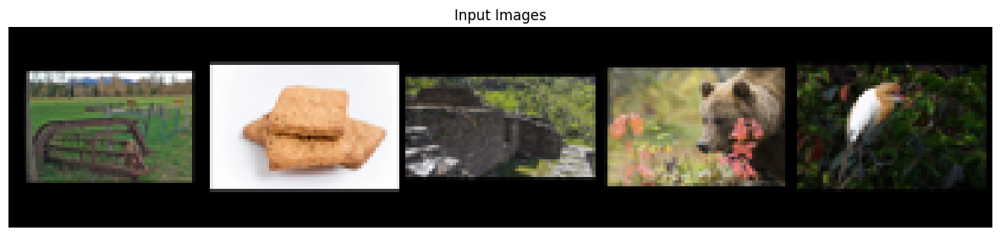

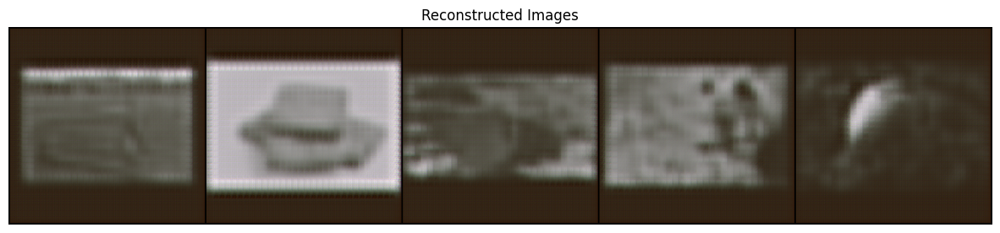

In [11]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

# Experiment 2

In [12]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()
        # Encoder

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 8, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.AvgPool2d(kernel_size=2, stride=2),
            nn.Conv2d(8, 16, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.AvgPool2d(kernel_size=2, stride=2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.ConvTranspose2d(32, 16, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.ConvTranspose2d(16, 8, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.Conv2d(8, 3, kernel_size=3, stride=1, padding=1),
        )
        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        # optimizer = SGD(self.parameters(), lr=0.01, momentum=0.99)
        optimizer = AdamW(self.parameters(), lr = 1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr 
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v2.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
    
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 98.4 K
1 | decoder   | Sequential | 98.3 K
2 | criterion | MSELoss    | 0     
-----------------------------------------
196 K     Trainable params
0         Non-trainable params
196 K     Total params
0.787     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]                                
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 8, 128, 128]             224
              SiLU-2          [-1, 8, 128, 128]               0
         AvgPool2d-3            [-1, 8, 64, 64]               0
            Conv2d-4           [-1, 16, 64, 64]           1,168
              SiLU-5           [-1, 16, 64, 64]               0
         AvgPool2d-6           [-1, 16, 32, 32]               0
            Conv2d-7           [-1, 32, 32, 32]           4,640
              SiLU-8           [-1, 32, 32, 32]               0
            Conv2d-9           [-1, 64, 32, 32]          18,496
             SiLU-10           [-1, 64, 32, 32]               0
           Conv2d-11          [-1, 128, 32, 32]          73,856
             SiLU-12          [-1, 128, 32, 32]               0
  ConvTranspose2d-13       

Metric val/loss improved. New best score: 0.156


Epoch 1: 100%|██████████| 34/34 [00:11<00:00,  2.86it/s, v_num=29, train/loss_step=0.155, val/loss_step=0.160, val/loss_epoch=0.148, train/loss_epoch=0.154]

Metric val/loss improved by 0.008 >= min_delta = 0.005. New best score: 0.148


Epoch 2: 100%|██████████| 34/34 [00:10<00:00,  3.18it/s, v_num=29, train/loss_step=0.0739, val/loss_step=0.0839, val/loss_epoch=0.0799, train/loss_epoch=0.120]

Metric val/loss improved by 0.068 >= min_delta = 0.005. New best score: 0.080


Epoch 3: 100%|██████████| 34/34 [00:10<00:00,  3.31it/s, v_num=29, train/loss_step=0.0502, val/loss_step=0.0602, val/loss_epoch=0.0578, train/loss_epoch=0.0679]

Metric val/loss improved by 0.022 >= min_delta = 0.005. New best score: 0.058


Epoch 4: 100%|██████████| 34/34 [00:10<00:00,  3.24it/s, v_num=29, train/loss_step=0.0489, val/loss_step=0.0501, val/loss_epoch=0.0489, train/loss_epoch=0.0537]

Metric val/loss improved by 0.009 >= min_delta = 0.005. New best score: 0.049


Epoch 6: 100%|██████████| 34/34 [00:10<00:00,  3.30it/s, v_num=29, train/loss_step=0.0489, val/loss_step=0.0446, val/loss_epoch=0.0438, train/loss_epoch=0.0454]

Metric val/loss improved by 0.005 >= min_delta = 0.005. New best score: 0.044


Epoch 9: 100%|██████████| 34/34 [00:10<00:00,  3.33it/s, v_num=29, train/loss_step=0.0388, val/loss_step=0.0386, val/loss_epoch=0.0381, train/loss_epoch=0.0399]

Metric val/loss improved by 0.006 >= min_delta = 0.005. New best score: 0.038


Epoch 11: 100%|██████████| 34/34 [00:10<00:00,  3.27it/s, v_num=29, train/loss_step=0.0308, val/loss_step=0.0306, val/loss_epoch=0.0302, train/loss_epoch=0.0324]

Metric val/loss improved by 0.008 >= min_delta = 0.005. New best score: 0.030


Epoch 16: 100%|██████████| 34/34 [00:10<00:00,  3.27it/s, v_num=29, train/loss_step=0.0263, val/loss_step=0.0249, val/loss_epoch=0.0248, train/loss_epoch=0.0256]

Metric val/loss improved by 0.005 >= min_delta = 0.005. New best score: 0.025


Epoch 26: 100%|██████████| 34/34 [00:10<00:00,  3.23it/s, v_num=29, train/loss_step=0.0219, val/loss_step=0.021, val/loss_epoch=0.0209, train/loss_epoch=0.0211] 

Monitored metric val/loss did not improve in the last 10 records. Best score: 0.025. Signaling Trainer to stop.


Epoch 26: 100%|██████████| 34/34 [00:10<00:00,  3.22it/s, v_num=29, train/loss_step=0.0219, val/loss_step=0.021, val/loss_epoch=0.0209, train/loss_epoch=0.0211]


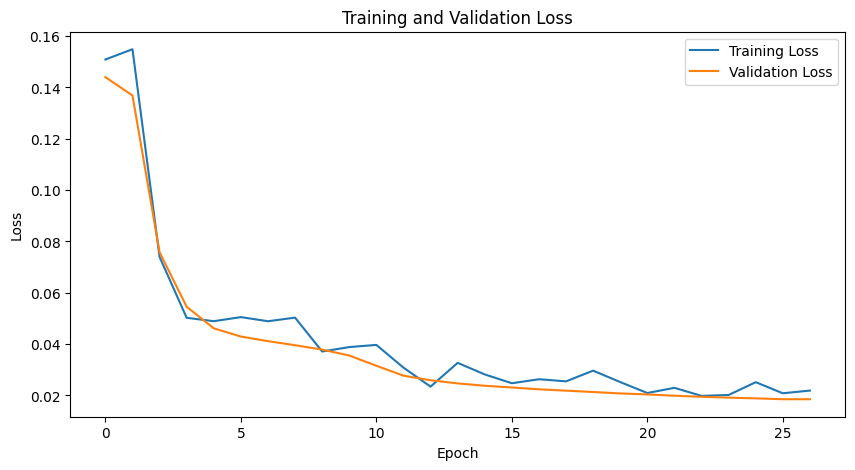

Average PSNR between Sr and reconstructed images: 15.32 dB
Average SSIM between Sr and reconstructed images: 0.2439


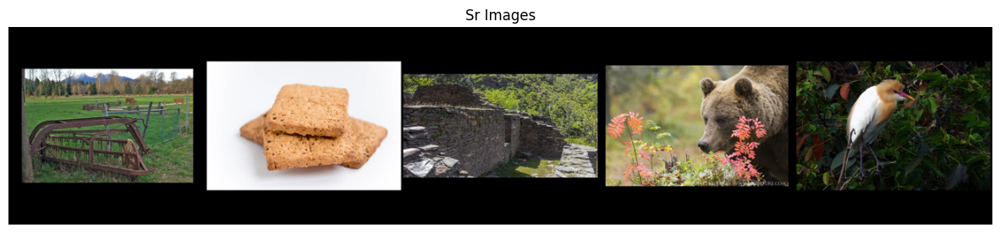

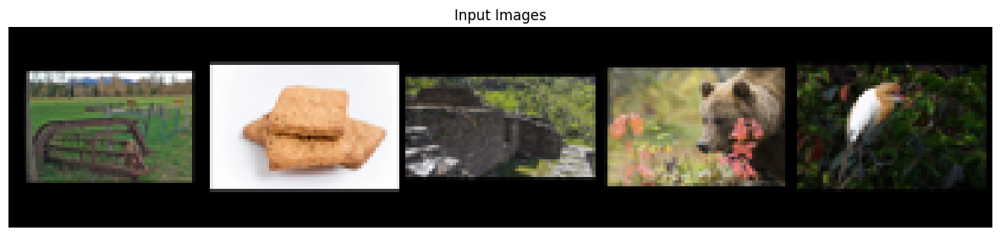

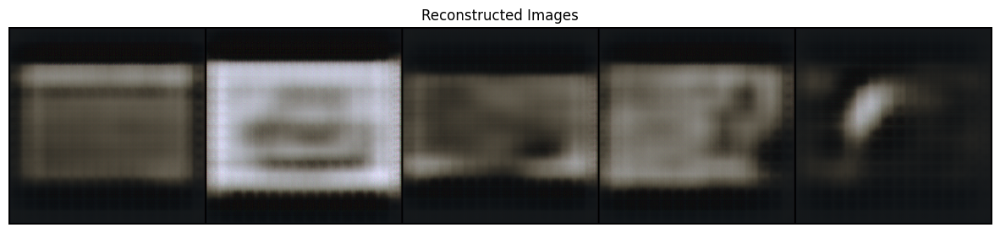

In [13]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

# Experiment 3

In [14]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()
        # Encoder

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 8, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.AvgPool2d(kernel_size=2, stride=2),
            nn.Conv2d(8, 16, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.AvgPool2d(kernel_size=2, stride=2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.AvgPool2d(kernel_size=2, stride=2),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.ConvTranspose2d(32, 16, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.ConvTranspose2d(16, 8, 3, stride=2, padding=1, output_padding=1),
            nn.SiLU(),
            nn.Conv2d(8, 3, kernel_size=3, stride=1, padding=1),
        )
        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        # optimizer = SGD(self.parameters(), lr=0.01, momentum=0.99)
        optimizer = AdamW(self.parameters(), lr = 1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v3.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 393 K 
1 | decoder   | Sequential | 393 K 
2 | criterion | MSELoss    | 0     
-----------------------------------------
786 K     Trainable params
0         Non-trainable params
786 K     Total params
3.147     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]                                
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 8, 128, 128]             224
              SiLU-2          [-1, 8, 128, 128]               0
         AvgPool2d-3            [-1, 8, 64, 64]               0
            Conv2d-4           [-1, 16, 64, 64]           1,168
              SiLU-5           [-1, 16, 64, 64]               0
         AvgPool2d-6           [-1, 16, 32, 32]               0
            Conv2d-7           [-1, 32, 32, 32]           4,640
              SiLU-8           [-1, 32, 32, 32]               0
         AvgPool2d-9           [-1, 32, 16, 16]               0
           Conv2d-10           [-1, 64, 16, 16]          18,496
             SiLU-11           [-1, 64, 16, 16]               0
           Conv2d-12          [-1, 128, 16, 16]          73,856
             SiLU-13       

Metric val/loss improved. New best score: 0.212


Epoch 1: 100%|██████████| 34/34 [00:11<00:00,  3.01it/s, v_num=30, train/loss_step=0.199, val/loss_step=0.215, val/loss_epoch=0.202, train/loss_epoch=0.208]

Metric val/loss improved by 0.010 >= min_delta = 0.005. New best score: 0.202


Epoch 2: 100%|██████████| 34/34 [00:12<00:00,  2.64it/s, v_num=30, train/loss_step=0.154, val/loss_step=0.169, val/loss_epoch=0.158, train/loss_epoch=0.186]

Metric val/loss improved by 0.044 >= min_delta = 0.005. New best score: 0.158


Epoch 3: 100%|██████████| 34/34 [00:13<00:00,  2.60it/s, v_num=30, train/loss_step=0.0933, val/loss_step=0.101, val/loss_epoch=0.0945, train/loss_epoch=0.128]

Metric val/loss improved by 0.063 >= min_delta = 0.005. New best score: 0.095


Epoch 4: 100%|██████████| 34/34 [00:10<00:00,  3.13it/s, v_num=30, train/loss_step=0.0636, val/loss_step=0.0691, val/loss_epoch=0.0656, train/loss_epoch=0.0788]

Metric val/loss improved by 0.029 >= min_delta = 0.005. New best score: 0.066


Epoch 5: 100%|██████████| 34/34 [00:11<00:00,  2.96it/s, v_num=30, train/loss_step=0.0675, val/loss_step=0.0587, val/loss_epoch=0.0568, train/loss_epoch=0.0621]

Metric val/loss improved by 0.009 >= min_delta = 0.005. New best score: 0.057


Epoch 6: 100%|██████████| 34/34 [00:11<00:00,  2.93it/s, v_num=30, train/loss_step=0.0524, val/loss_step=0.0533, val/loss_epoch=0.0518, train/loss_epoch=0.0557]

Metric val/loss improved by 0.005 >= min_delta = 0.005. New best score: 0.052


Epoch 7: 100%|██████████| 34/34 [00:10<00:00,  3.24it/s, v_num=30, train/loss_step=0.0584, val/loss_step=0.0477, val/loss_epoch=0.0462, train/loss_epoch=0.0504]

Metric val/loss improved by 0.006 >= min_delta = 0.005. New best score: 0.046


Epoch 8: 100%|██████████| 34/34 [00:10<00:00,  3.27it/s, v_num=30, train/loss_step=0.0302, val/loss_step=0.0423, val/loss_epoch=0.0409, train/loss_epoch=0.045] 

Metric val/loss improved by 0.005 >= min_delta = 0.005. New best score: 0.041


Epoch 9: 100%|██████████| 34/34 [00:10<00:00,  3.28it/s, v_num=30, train/loss_step=0.0397, val/loss_step=0.0359, val/loss_epoch=0.0356, train/loss_epoch=0.0394]

Metric val/loss improved by 0.005 >= min_delta = 0.005. New best score: 0.036


Epoch 12: 100%|██████████| 34/34 [00:10<00:00,  3.19it/s, v_num=30, train/loss_step=0.0295, val/loss_step=0.0302, val/loss_epoch=0.0301, train/loss_epoch=0.0317]

Metric val/loss improved by 0.005 >= min_delta = 0.005. New best score: 0.030


Epoch 20: 100%|██████████| 34/34 [00:10<00:00,  3.25it/s, v_num=30, train/loss_step=0.0257, val/loss_step=0.0252, val/loss_epoch=0.025, train/loss_epoch=0.0258] 

Metric val/loss improved by 0.005 >= min_delta = 0.005. New best score: 0.025


Epoch 30: 100%|██████████| 34/34 [00:10<00:00,  3.20it/s, v_num=30, train/loss_step=0.0284, val/loss_step=0.0224, val/loss_epoch=0.0228, train/loss_epoch=0.0234]

Monitored metric val/loss did not improve in the last 10 records. Best score: 0.025. Signaling Trainer to stop.


Epoch 30: 100%|██████████| 34/34 [00:10<00:00,  3.18it/s, v_num=30, train/loss_step=0.0284, val/loss_step=0.0224, val/loss_epoch=0.0228, train/loss_epoch=0.0234]


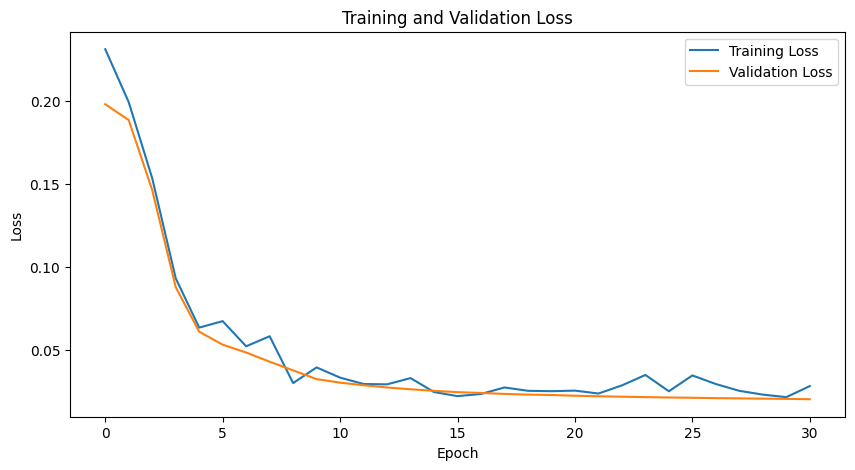

Average PSNR between Sr and reconstructed images: 13.23 dB
Average SSIM between Sr and reconstructed images: 0.2318


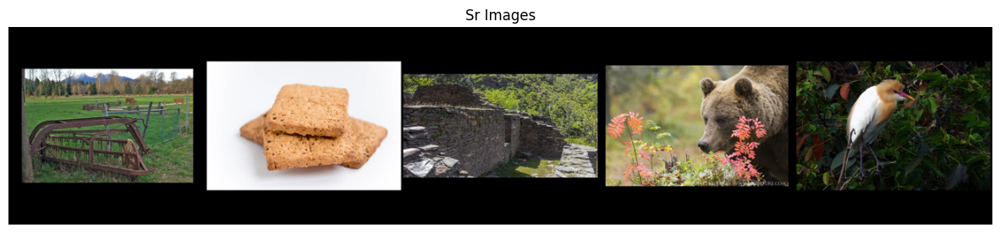

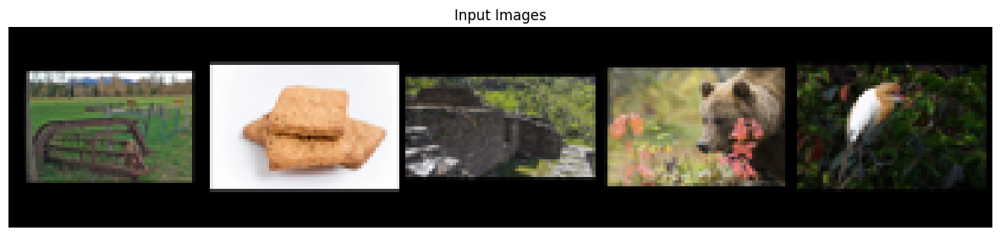

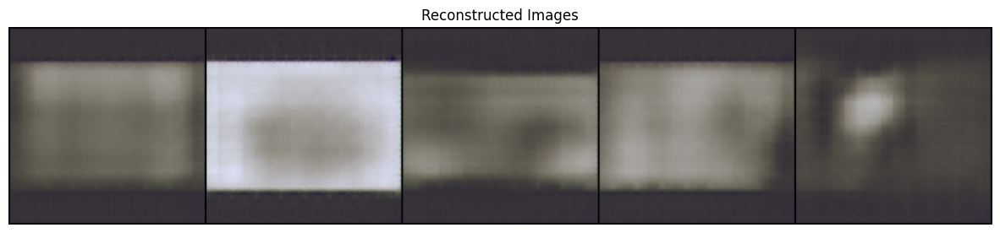

In [15]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

## Experiment 4

In [19]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 32x32

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),

            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),

            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),

            nn.Conv2d(32, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),

            nn.Conv2d(16, 3, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v4.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 393 K 
1 | decoder   | Sequential | 392 K 
2 | criterion | MSELoss    | 0     
-----------------------------------------
786 K     Trainable params
0         Non-trainable params
786 K     Total params
3.146     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]                                
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]             448
       BatchNorm2d-2         [-1, 16, 128, 128]              32
         LeakyReLU-3         [-1, 16, 128, 128]               0
            Conv2d-4         [-1, 32, 128, 128]           4,640
       BatchNorm2d-5         [-1, 32, 128, 128]              64
         LeakyReLU-6         [-1, 32, 128, 128]               0
         MaxPool2d-7           [-1, 32, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          18,496
       BatchNorm2d-9           [-1, 64, 64, 64]             128
        LeakyReLU-10           [-1, 64, 64, 64]               0
           Conv2d-11          [-1, 128, 64, 64]          73,856
      BatchNorm2d-12          [-1, 128, 64, 64]             256
        LeakyReLU-13       

Metric val/loss improved. New best score: 0.087


Epoch 1: 100%|██████████| 34/34 [03:17<00:00,  0.17it/s, v_num=33, train/loss_step=0.0328, val/loss_step=0.0284, val/loss_epoch=0.0268, train/loss_epoch=0.0355]

Metric val/loss improved by 0.061 >= min_delta = 0.005. New best score: 0.027


Epoch 2: 100%|██████████| 34/34 [03:22<00:00,  0.17it/s, v_num=33, train/loss_step=0.0168, val/loss_step=0.0159, val/loss_epoch=0.0149, train/loss_epoch=0.0186]

Metric val/loss improved by 0.012 >= min_delta = 0.005. New best score: 0.015


Epoch 5: 100%|██████████| 34/34 [03:20<00:00,  0.17it/s, v_num=33, train/loss_step=0.0124, val/loss_step=0.00968, val/loss_epoch=0.0093, train/loss_epoch=0.0101]

Metric val/loss improved by 0.006 >= min_delta = 0.005. New best score: 0.009


Epoch 15: 100%|██████████| 34/34 [03:35<00:00,  0.16it/s, v_num=33, train/loss_step=0.00815, val/loss_step=0.00711, val/loss_epoch=0.00705, train/loss_epoch=0.00724]

Monitored metric val/loss did not improve in the last 10 records. Best score: 0.009. Signaling Trainer to stop.


Epoch 15: 100%|██████████| 34/34 [03:35<00:00,  0.16it/s, v_num=33, train/loss_step=0.00815, val/loss_step=0.00711, val/loss_epoch=0.00705, train/loss_epoch=0.00724]


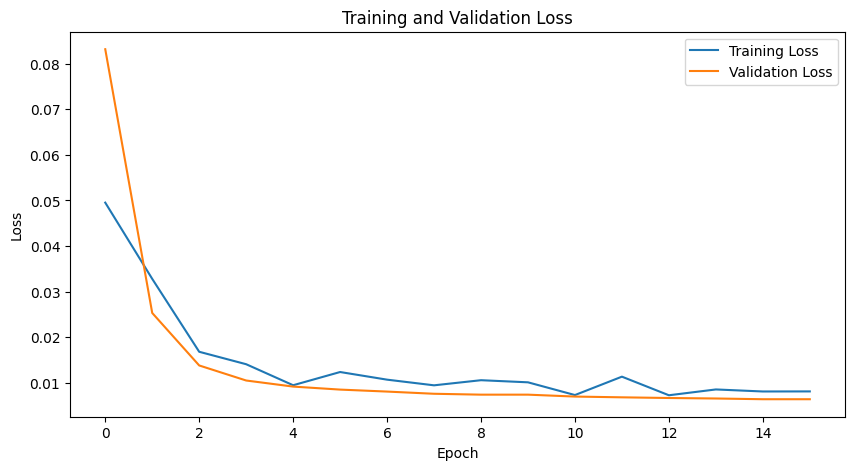

Average PSNR between Sr and reconstructed images: 16.93 dB
Average SSIM between Sr and reconstructed images: 0.2815


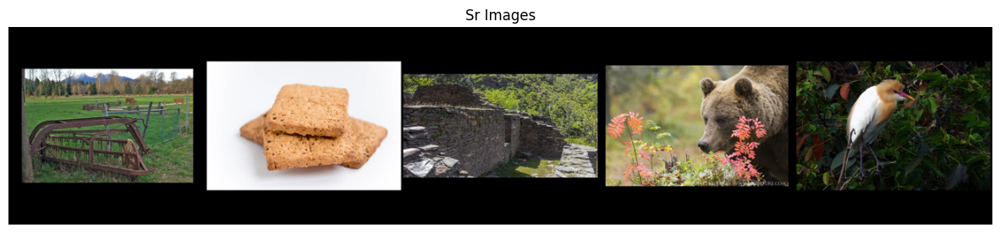

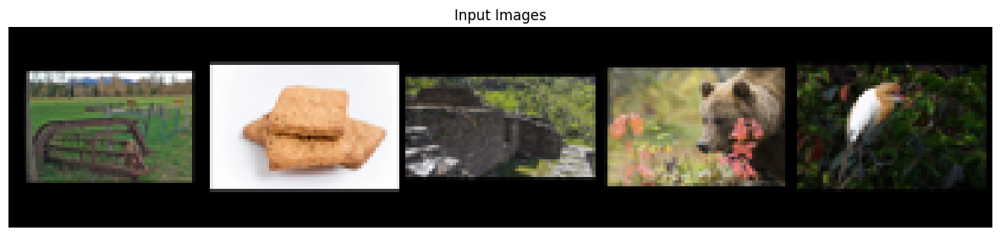

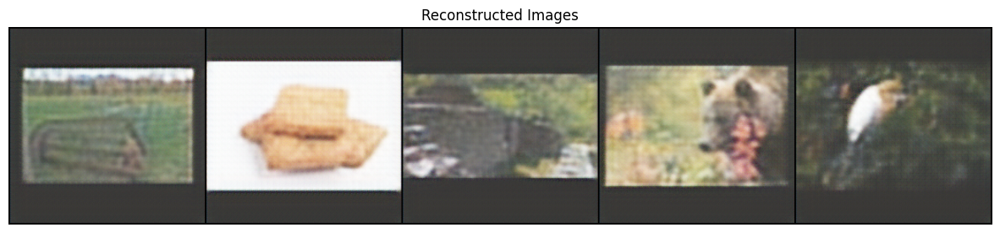

In [20]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size, scaled_size)

## Experiment 5

In [28]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 32x32

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),

            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),

            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),

            nn.Conv2d(32, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),

            nn.Conv2d(16, 3, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v5.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 541 K 
1 | decoder   | Sequential | 540 K 
2 | criterion | MSELoss    | 0     
-----------------------------------------
1.1 M     Trainable params
0         Non-trainable params
1.1 M     Total params
4.328     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]                                
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]             448
       BatchNorm2d-2         [-1, 16, 128, 128]              32
         LeakyReLU-3         [-1, 16, 128, 128]               0
            Conv2d-4         [-1, 32, 128, 128]           4,640
       BatchNorm2d-5         [-1, 32, 128, 128]              64
         LeakyReLU-6         [-1, 32, 128, 128]               0
         MaxPool2d-7           [-1, 32, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          18,496
       BatchNorm2d-9           [-1, 64, 64, 64]             128
        LeakyReLU-10           [-1, 64, 64, 64]               0
           Conv2d-11          [-1, 128, 64, 64]          73,856
      BatchNorm2d-12          [-1, 128, 64, 64]             256
        LeakyReLU-13       

Metric val/loss improved. New best score: 0.059


Epoch 1: 100%|██████████| 34/34 [04:31<00:00,  0.13it/s, v_num=37, train/loss_step=0.0148, val/loss_step=0.0163, val/loss_epoch=0.0161, train/loss_epoch=0.0208]

Metric val/loss improved by 0.043 >= min_delta = 0.0005. New best score: 0.016


Epoch 2: 100%|██████████| 34/34 [04:30<00:00,  0.13it/s, v_num=37, train/loss_step=0.0131, val/loss_step=0.0124, val/loss_epoch=0.0121, train/loss_epoch=0.0138]

Metric val/loss improved by 0.004 >= min_delta = 0.0005. New best score: 0.012


Epoch 3: 100%|██████████| 34/34 [04:18<00:00,  0.13it/s, v_num=37, train/loss_step=0.0123, val/loss_step=0.011, val/loss_epoch=0.0106, train/loss_epoch=0.0118] 

Metric val/loss improved by 0.002 >= min_delta = 0.0005. New best score: 0.011


Epoch 4: 100%|██████████| 34/34 [04:19<00:00,  0.13it/s, v_num=37, train/loss_step=0.0133, val/loss_step=0.0104, val/loss_epoch=0.010, train/loss_epoch=0.0107] 

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.010


Epoch 5: 100%|██████████| 34/34 [04:10<00:00,  0.14it/s, v_num=37, train/loss_step=0.011, val/loss_step=0.00957, val/loss_epoch=0.00922, train/loss_epoch=0.00991]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.009


Epoch 6: 100%|██████████| 34/34 [04:06<00:00,  0.14it/s, v_num=37, train/loss_step=0.011, val/loss_step=0.00904, val/loss_epoch=0.00871, train/loss_epoch=0.00956]  

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.009


Epoch 8: 100%|██████████| 34/34 [04:14<00:00,  0.13it/s, v_num=37, train/loss_step=0.00956, val/loss_step=0.00826, val/loss_epoch=0.00802, train/loss_epoch=0.00865]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.008


Epoch 11: 100%|██████████| 34/34 [04:39<00:00,  0.12it/s, v_num=37, train/loss_step=0.00967, val/loss_step=0.00754, val/loss_epoch=0.00739, train/loss_epoch=0.0079] 

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.007


Epoch 16: 100%|██████████| 34/34 [04:29<00:00,  0.13it/s, v_num=37, train/loss_step=0.0095, val/loss_step=0.0069, val/loss_epoch=0.00683, train/loss_epoch=0.0073]   

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.007


Epoch 26: 100%|██████████| 34/34 [05:00<00:00,  0.11it/s, v_num=37, train/loss_step=0.00707, val/loss_step=0.00649, val/loss_epoch=0.00643, train/loss_epoch=0.00665]

Monitored metric val/loss did not improve in the last 10 records. Best score: 0.007. Signaling Trainer to stop.


Epoch 26: 100%|██████████| 34/34 [05:00<00:00,  0.11it/s, v_num=37, train/loss_step=0.00707, val/loss_step=0.00649, val/loss_epoch=0.00643, train/loss_epoch=0.00665]


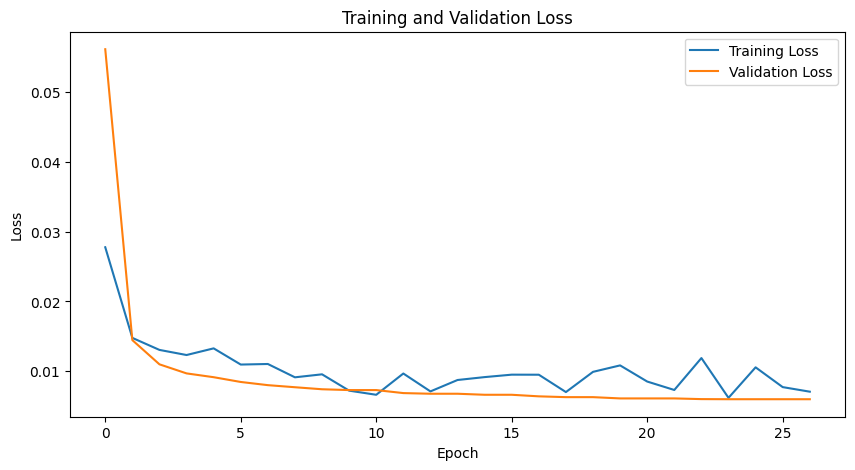

Average PSNR between Sr and reconstructed images: 17.79 dB
Average SSIM between Sr and reconstructed images: 0.3057


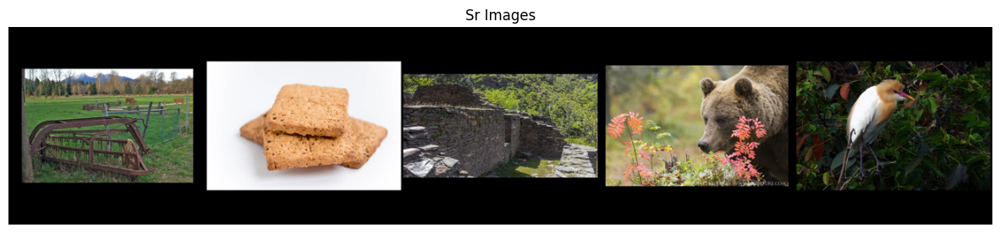

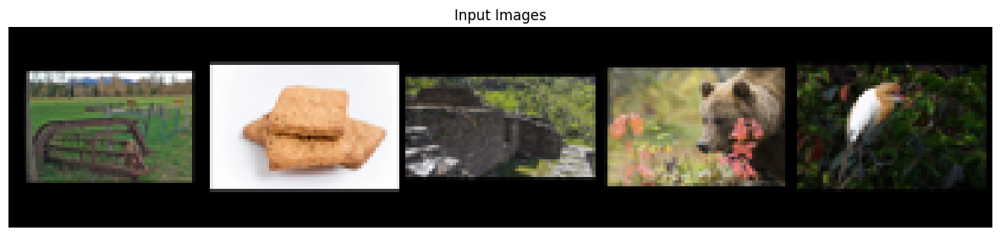

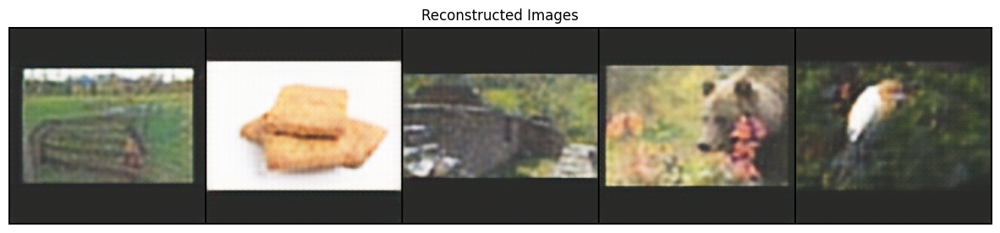

In [29]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.0005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

## Experiment 6

In [9]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 32x32

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 3, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v6.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3050 Ti Laptop GPU') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 689 K 
1 | decoder   | Sequential | 688 K 
2 | criterion | MSELoss    | 0     
-----------------------------------------
1.4 M     Trainable params
0         Non-trainable params
1.4 M     Total params
5.511     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]                                
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]             448
       BatchNorm2d-2         [-1, 16, 128, 128]              32
         LeakyReLU-3         [-1, 16, 128, 128]               0
            Conv2d-4         [-1, 32, 128, 128]           4,640
       BatchNorm2d-5         [-1, 32, 128, 128]              64
         LeakyReLU-6         [-1, 32, 128, 128]               0
         MaxPool2d-7           [-1, 32, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          18,496
       BatchNorm2d-9           [-1, 64, 64, 64]             128
        LeakyReLU-10           [-1, 64, 64, 64]               0
           Conv2d-11          [-1, 128, 64, 64]          73,856
      BatchNorm2d-12          [-1, 128, 64, 64]             256
        LeakyReLU-13       

Metric val/loss improved. New best score: 0.098


Epoch 1: 100%|██████████| 34/34 [03:03<00:00,  0.19it/s, v_num=39, train/loss_step=0.0262, val/loss_step=0.0219, val/loss_epoch=0.0206, train/loss_epoch=0.0306]

Metric val/loss improved by 0.078 >= min_delta = 0.0005. New best score: 0.021


Epoch 2: 100%|██████████| 34/34 [03:00<00:00,  0.19it/s, v_num=39, train/loss_step=0.0167, val/loss_step=0.0141, val/loss_epoch=0.0137, train/loss_epoch=0.0167]

Metric val/loss improved by 0.007 >= min_delta = 0.0005. New best score: 0.014


Epoch 3: 100%|██████████| 34/34 [03:04<00:00,  0.18it/s, v_num=39, train/loss_step=0.0191, val/loss_step=0.0132, val/loss_epoch=0.0122, train/loss_epoch=0.0127]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.012


Epoch 4: 100%|██████████| 34/34 [03:18<00:00,  0.17it/s, v_num=39, train/loss_step=0.0146, val/loss_step=0.0119, val/loss_epoch=0.0111, train/loss_epoch=0.0112] 

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.011


Epoch 5: 100%|██████████| 34/34 [03:08<00:00,  0.18it/s, v_num=39, train/loss_step=0.00973, val/loss_step=0.0103, val/loss_epoch=0.00978, train/loss_epoch=0.0104]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.010


Epoch 6: 100%|██████████| 34/34 [03:08<00:00,  0.18it/s, v_num=39, train/loss_step=0.00945, val/loss_step=0.00892, val/loss_epoch=0.00871, train/loss_epoch=0.00958]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.009


Epoch 10: 100%|██████████| 34/34 [02:54<00:00,  0.20it/s, v_num=39, train/loss_step=0.0131, val/loss_step=0.00808, val/loss_epoch=0.00784, train/loss_epoch=0.00865] 

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.008


Epoch 15: 100%|██████████| 34/34 [02:55<00:00,  0.19it/s, v_num=39, train/loss_step=0.00843, val/loss_step=0.00715, val/loss_epoch=0.00705, train/loss_epoch=0.00764]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.007


Epoch 24: 100%|██████████| 34/34 [03:18<00:00,  0.17it/s, v_num=39, train/loss_step=0.00874, val/loss_step=0.00658, val/loss_epoch=0.00647, train/loss_epoch=0.00692]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.006


Epoch 34: 100%|██████████| 34/34 [02:55<00:00,  0.19it/s, v_num=39, train/loss_step=0.00821, val/loss_step=0.00622, val/loss_epoch=0.00607, train/loss_epoch=0.00646]

Monitored metric val/loss did not improve in the last 10 records. Best score: 0.006. Signaling Trainer to stop.


Epoch 34: 100%|██████████| 34/34 [02:55<00:00,  0.19it/s, v_num=39, train/loss_step=0.00821, val/loss_step=0.00622, val/loss_epoch=0.00607, train/loss_epoch=0.00646]


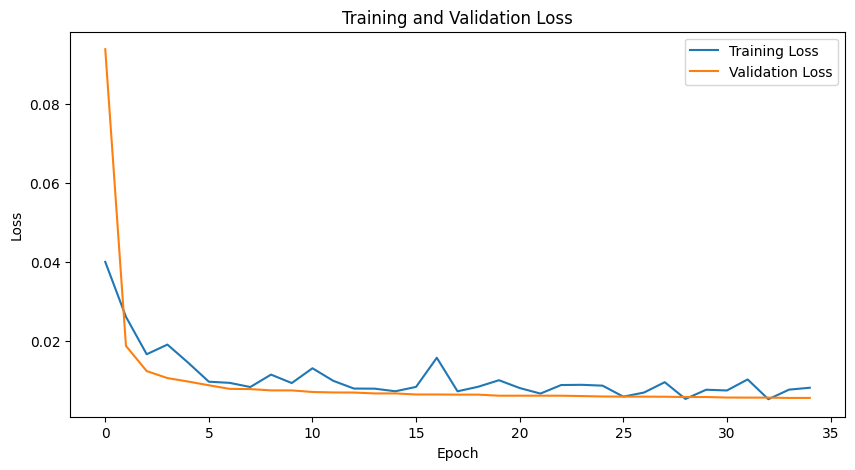

Average PSNR between Sr and reconstructed images: 18.61 dB
Average SSIM between Sr and reconstructed images: 0.3107


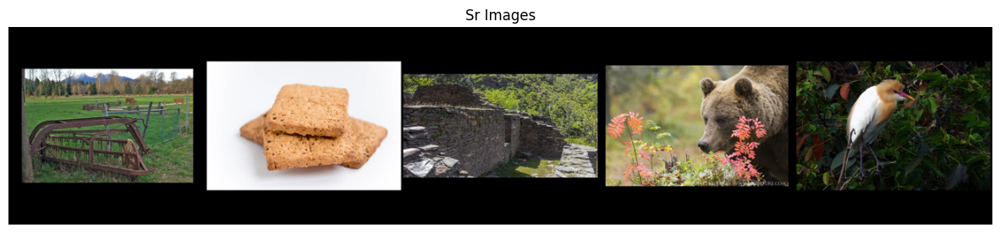

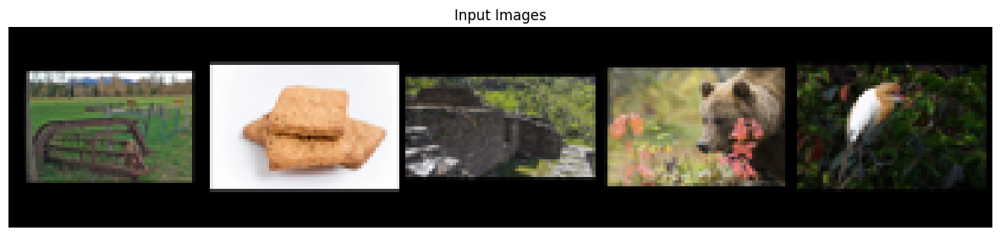

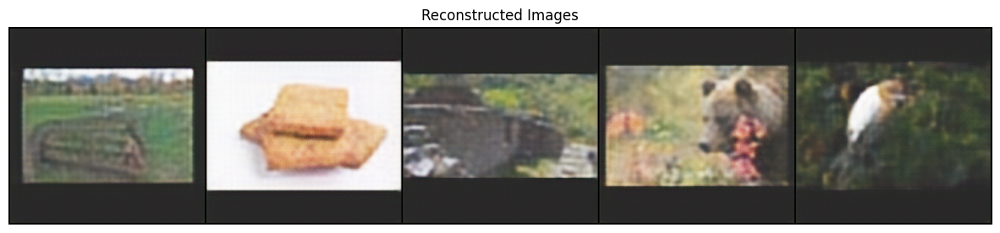

In [10]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.0005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

## Experiment 7

In [6]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 32x32

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 16x16
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 256, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 3, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v7.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3050 Ti Laptop GPU') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 1.1 M 
1 | decoder   | Sequential | 1.1 M 
2 | criterion | MSELoss    | 0     
-----------------------------------------
2.3 M     Trainable params
0         Non-trainable params
2.3 M     Total params
9.053     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]                                
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]             448
       BatchNorm2d-2         [-1, 16, 128, 128]              32
         LeakyReLU-3         [-1, 16, 128, 128]               0
            Conv2d-4         [-1, 32, 128, 128]           4,640
       BatchNorm2d-5         [-1, 32, 128, 128]              64
         LeakyReLU-6         [-1, 32, 128, 128]               0
         MaxPool2d-7           [-1, 32, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          18,496
       BatchNorm2d-9           [-1, 64, 64, 64]             128
        LeakyReLU-10           [-1, 64, 64, 64]               0
           Conv2d-11          [-1, 128, 64, 64]          73,856
      BatchNorm2d-12          [-1, 128, 64, 64]             256
        LeakyReLU-13       

Metric val/loss improved. New best score: 0.029


Epoch 1: 100%|██████████| 67/67 [04:28<00:00,  0.25it/s, v_num=44, train/loss_step=0.0286, val/loss_step=0.0172, val/loss_epoch=0.0158, train/loss_epoch=0.0198]

Metric val/loss improved by 0.014 >= min_delta = 0.0005. New best score: 0.016


Epoch 2: 100%|██████████| 67/67 [04:28<00:00,  0.25it/s, v_num=44, train/loss_step=0.0115, val/loss_step=0.0146, val/loss_epoch=0.013, train/loss_epoch=0.0145] 

Metric val/loss improved by 0.003 >= min_delta = 0.0005. New best score: 0.013


Epoch 3: 100%|██████████| 67/67 [04:28<00:00,  0.25it/s, v_num=44, train/loss_step=0.0145, val/loss_step=0.0122, val/loss_epoch=0.0115, train/loss_epoch=0.0131]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.012


Epoch 4: 100%|██████████| 67/67 [04:29<00:00,  0.25it/s, v_num=44, train/loss_step=0.0091, val/loss_step=0.0114, val/loss_epoch=0.011, train/loss_epoch=0.0122] 

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.011


Epoch 7: 100%|██████████| 67/67 [04:19<00:00,  0.26it/s, v_num=44, train/loss_step=0.0101, val/loss_step=0.011, val/loss_epoch=0.0101, train/loss_epoch=0.0111]  

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.010


Epoch 11: 100%|██████████| 67/67 [04:18<00:00,  0.26it/s, v_num=44, train/loss_step=0.00878, val/loss_step=0.00928, val/loss_epoch=0.00907, train/loss_epoch=0.00975]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.009


Epoch 17: 100%|██████████| 67/67 [04:17<00:00,  0.26it/s, v_num=44, train/loss_step=0.00747, val/loss_step=0.00857, val/loss_epoch=0.00833, train/loss_epoch=0.00908]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.008


Epoch 25: 100%|██████████| 67/67 [04:18<00:00,  0.26it/s, v_num=44, train/loss_step=0.0138, val/loss_step=0.00783, val/loss_epoch=0.00765, train/loss_epoch=0.00823] 

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.008


Epoch 35: 100%|██████████| 67/67 [04:18<00:00,  0.26it/s, v_num=44, train/loss_step=0.00931, val/loss_step=0.00767, val/loss_epoch=0.00745, train/loss_epoch=0.00748]

Monitored metric val/loss did not improve in the last 10 records. Best score: 0.008. Signaling Trainer to stop.


Epoch 35: 100%|██████████| 67/67 [04:19<00:00,  0.26it/s, v_num=44, train/loss_step=0.00931, val/loss_step=0.00767, val/loss_epoch=0.00745, train/loss_epoch=0.00748]


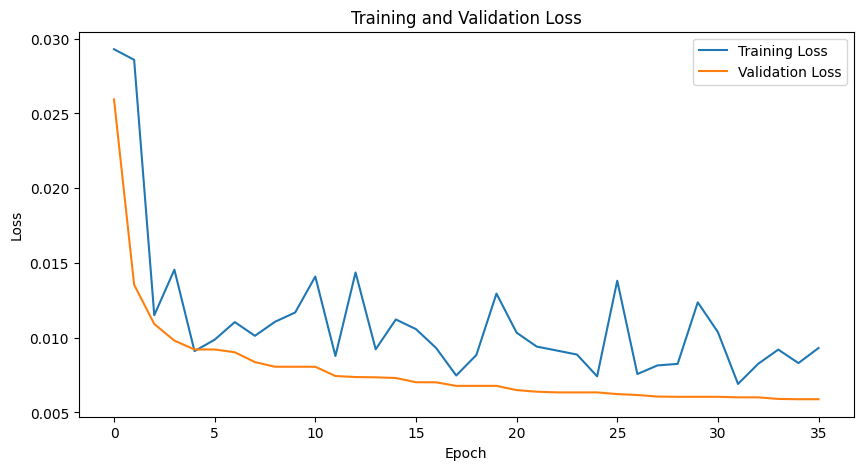

Average PSNR between Sr and reconstructed images: 19.06 dB
Average SSIM between Sr and reconstructed images: 0.3090


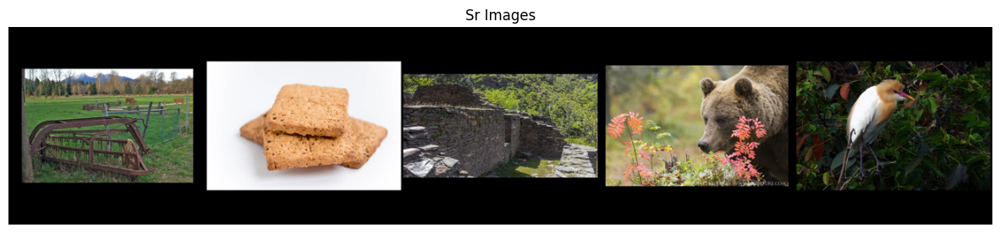

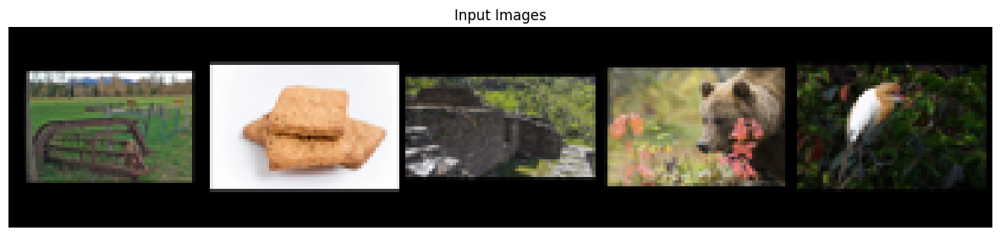

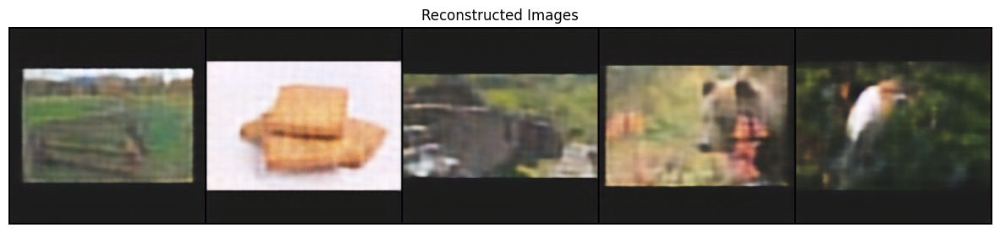

In [7]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.0005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

## Experiment 8

In [8]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 32x32

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 16x16
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 256, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 3, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v8.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 1.1 M 
1 | decoder   | Sequential | 1.1 M 
2 | criterion | MSELoss    | 0     
-----------------------------------------
2.3 M     Trainable params
0         Non-trainable params
2.3 M     Total params
9.053     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]                                
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]             448
       BatchNorm2d-2         [-1, 16, 128, 128]              32
         LeakyReLU-3         [-1, 16, 128, 128]               0
            Conv2d-4         [-1, 32, 128, 128]           4,640
       BatchNorm2d-5         [-1, 32, 128, 128]              64
         LeakyReLU-6         [-1, 32, 128, 128]               0
         MaxPool2d-7           [-1, 32, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          18,496
       BatchNorm2d-9           [-1, 64, 64, 64]             128
        LeakyReLU-10           [-1, 64, 64, 64]               0
           Conv2d-11          [-1, 128, 64, 64]          73,856
      BatchNorm2d-12          [-1, 128, 64, 64]             256
        LeakyReLU-13       

Metric val/loss improved. New best score: 0.024


Epoch 1: 100%|██████████| 67/67 [07:43<00:00,  0.14it/s, v_num=45, train/loss_step=0.0171, val/loss_step=0.0143, val/loss_epoch=0.0144, train/loss_epoch=0.0182]

Metric val/loss improved by 0.010 >= min_delta = 0.0005. New best score: 0.014


Epoch 2: 100%|██████████| 67/67 [07:43<00:00,  0.14it/s, v_num=45, train/loss_step=0.0117, val/loss_step=0.0121, val/loss_epoch=0.012, train/loss_epoch=0.0142] 

Metric val/loss improved by 0.002 >= min_delta = 0.0005. New best score: 0.012


Epoch 4: 100%|██████████| 67/67 [07:43<00:00,  0.14it/s, v_num=45, train/loss_step=0.0123, val/loss_step=0.0107, val/loss_epoch=0.0108, train/loss_epoch=0.0117]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.011


Epoch 6: 100%|██████████| 67/67 [07:42<00:00,  0.14it/s, v_num=45, train/loss_step=0.0112, val/loss_step=0.00995, val/loss_epoch=0.010, train/loss_epoch=0.0109] 

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.010


Epoch 8: 100%|██████████| 67/67 [07:45<00:00,  0.14it/s, v_num=45, train/loss_step=0.0105, val/loss_step=0.00904, val/loss_epoch=0.00908, train/loss_epoch=0.00998]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.009


Epoch 12: 100%|██████████| 67/67 [11:39<00:00,  0.10it/s, v_num=45, train/loss_step=0.00859, val/loss_step=0.00839, val/loss_epoch=0.00849, train/loss_epoch=0.00906]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.008


Epoch 17: 100%|██████████| 67/67 [08:08<00:00,  0.14it/s, v_num=45, train/loss_step=0.00882, val/loss_step=0.00779, val/loss_epoch=0.00775, train/loss_epoch=0.00837]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.008


Epoch 26: 100%|██████████| 67/67 [08:07<00:00,  0.14it/s, v_num=45, train/loss_step=0.00877, val/loss_step=0.00715, val/loss_epoch=0.00711, train/loss_epoch=0.00751]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.007


Epoch 36: 100%|██████████| 67/67 [07:58<00:00,  0.14it/s, v_num=45, train/loss_step=0.0095, val/loss_step=0.00664, val/loss_epoch=0.00656, train/loss_epoch=0.00699] 

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.007


Epoch 46: 100%|██████████| 67/67 [08:15<00:00,  0.14it/s, v_num=45, train/loss_step=0.00636, val/loss_step=0.00686, val/loss_epoch=0.00672, train/loss_epoch=0.00671]

Monitored metric val/loss did not improve in the last 10 records. Best score: 0.007. Signaling Trainer to stop.


Epoch 46: 100%|██████████| 67/67 [08:16<00:00,  0.14it/s, v_num=45, train/loss_step=0.00636, val/loss_step=0.00686, val/loss_epoch=0.00672, train/loss_epoch=0.00671]


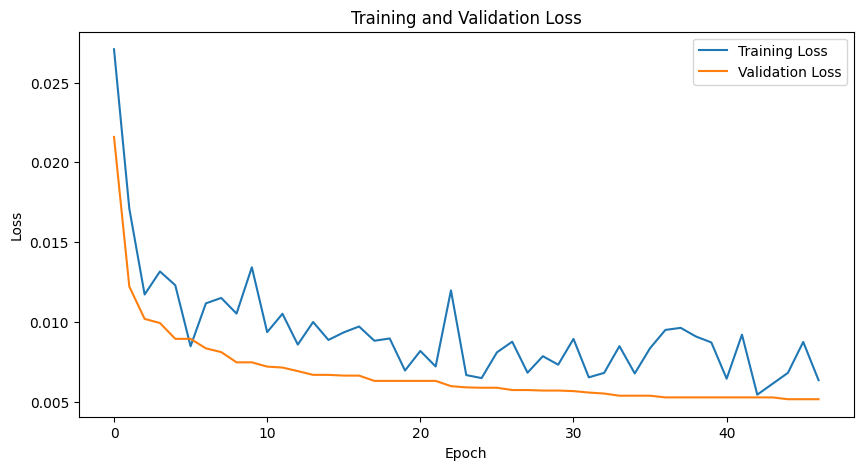

Average PSNR between Sr and reconstructed images: 19.39 dB
Average SSIM between Sr and reconstructed images: 0.3187


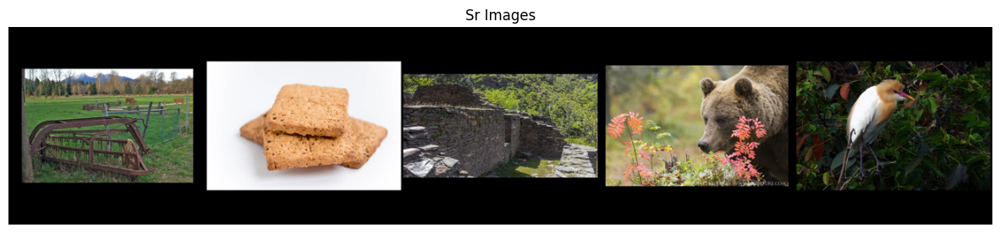

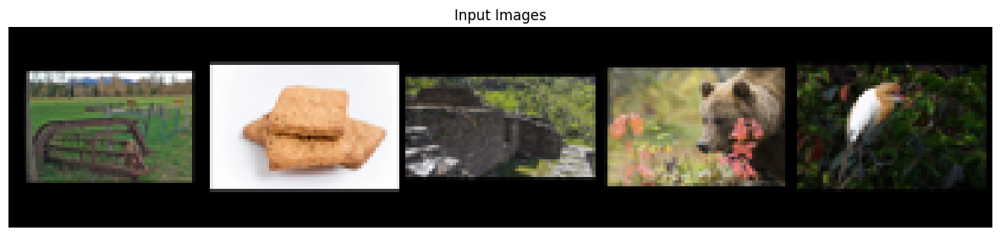

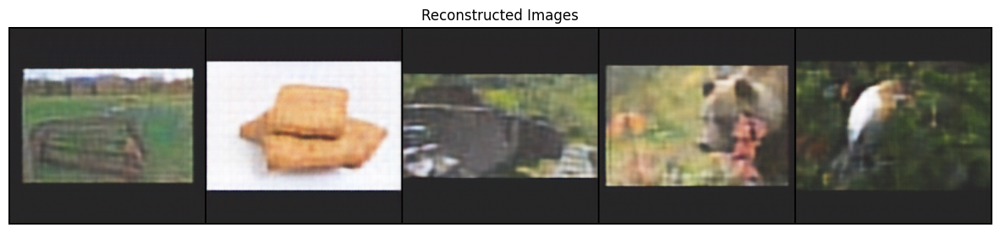

In [9]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.0005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

## Experiment 9

In [10]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=7, stride=1, padding=4),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 64x64

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 32x32
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 256, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 16, kernel_size=5, stride=1, padding=3),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 3, kernel_size=7, stride=1, padding=2),
            nn.Tanh()
        )

        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v9.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 1.1 M 
1 | decoder   | Sequential | 1.1 M 
2 | criterion | MSELoss    | 0     
-----------------------------------------
2.3 M     Trainable params
0         Non-trainable params
2.3 M     Total params
9.134     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]                                
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 130, 130]           2,368
       BatchNorm2d-2         [-1, 16, 130, 130]              32
         LeakyReLU-3         [-1, 16, 130, 130]               0
            Conv2d-4         [-1, 32, 130, 130]          12,832
       BatchNorm2d-5         [-1, 32, 130, 130]              64
         LeakyReLU-6         [-1, 32, 130, 130]               0
         MaxPool2d-7           [-1, 32, 65, 65]               0
            Conv2d-8           [-1, 64, 65, 65]          18,496
       BatchNorm2d-9           [-1, 64, 65, 65]             128
        LeakyReLU-10           [-1, 64, 65, 65]               0
           Conv2d-11          [-1, 128, 65, 65]          73,856
      BatchNorm2d-12          [-1, 128, 65, 65]             256
        LeakyReLU-13       

Metric val/loss improved. New best score: 0.020


Epoch 1: 100%|██████████| 67/67 [10:14<00:00,  0.11it/s, v_num=46, train/loss_step=0.0182, val/loss_step=0.016, val/loss_epoch=0.016, train/loss_epoch=0.0176] 

Metric val/loss improved by 0.004 >= min_delta = 0.0005. New best score: 0.016


Epoch 2: 100%|██████████| 67/67 [10:11<00:00,  0.11it/s, v_num=46, train/loss_step=0.0118, val/loss_step=0.0122, val/loss_epoch=0.0119, train/loss_epoch=0.0146]

Metric val/loss improved by 0.004 >= min_delta = 0.0005. New best score: 0.012


Epoch 3: 100%|██████████| 67/67 [10:15<00:00,  0.11it/s, v_num=46, train/loss_step=0.0138, val/loss_step=0.0112, val/loss_epoch=0.0109, train/loss_epoch=0.0122]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.011


Epoch 5: 100%|██████████| 67/67 [10:18<00:00,  0.11it/s, v_num=46, train/loss_step=0.00911, val/loss_step=0.0107, val/loss_epoch=0.0104, train/loss_epoch=0.0112]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.010


Epoch 6: 100%|██████████| 67/67 [10:23<00:00,  0.11it/s, v_num=46, train/loss_step=0.00985, val/loss_step=0.0101, val/loss_epoch=0.00982, train/loss_epoch=0.0109]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.010


Epoch 10: 100%|██████████| 67/67 [10:14<00:00,  0.11it/s, v_num=46, train/loss_step=0.00995, val/loss_step=0.00949, val/loss_epoch=0.00918, train/loss_epoch=0.00979]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.009


Epoch 15: 100%|██████████| 67/67 [10:18<00:00,  0.11it/s, v_num=46, train/loss_step=0.00892, val/loss_step=0.00903, val/loss_epoch=0.00867, train/loss_epoch=0.00907]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.009


Epoch 21: 100%|██████████| 67/67 [10:19<00:00,  0.11it/s, v_num=46, train/loss_step=0.00764, val/loss_step=0.00829, val/loss_epoch=0.00798, train/loss_epoch=0.00849]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.008


Epoch 25: 100%|██████████| 67/67 [10:16<00:00,  0.11it/s, v_num=46, train/loss_step=0.0094, val/loss_step=0.00742, val/loss_epoch=0.0073, train/loss_epoch=0.00788]  

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.007


Epoch 35: 100%|██████████| 67/67 [10:11<00:00,  0.11it/s, v_num=46, train/loss_step=0.011, val/loss_step=0.00699, val/loss_epoch=0.00687, train/loss_epoch=0.00722]  

Monitored metric val/loss did not improve in the last 10 records. Best score: 0.007. Signaling Trainer to stop.


Epoch 35: 100%|██████████| 67/67 [10:11<00:00,  0.11it/s, v_num=46, train/loss_step=0.011, val/loss_step=0.00699, val/loss_epoch=0.00687, train/loss_epoch=0.00722]


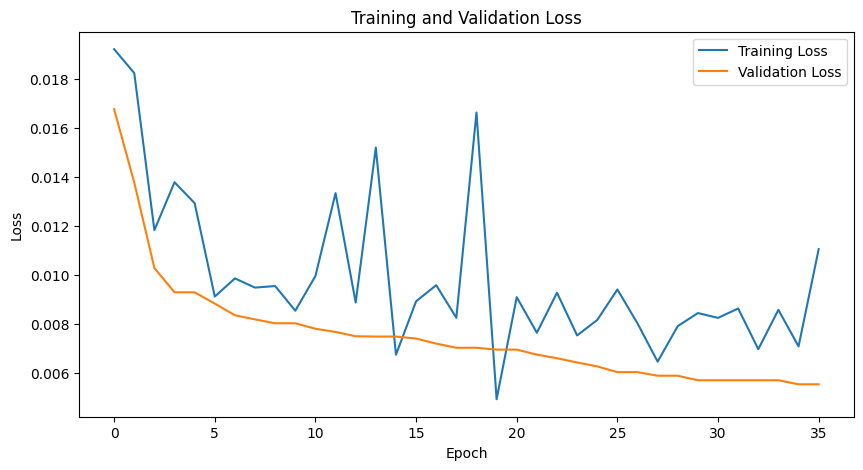

Average PSNR between Sr and reconstructed images: 18.05 dB
Average SSIM between Sr and reconstructed images: 0.3211


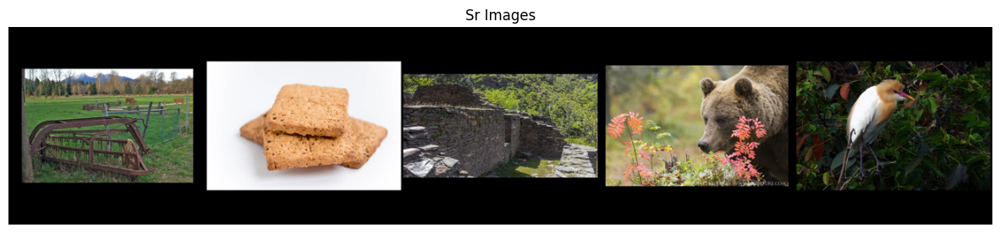

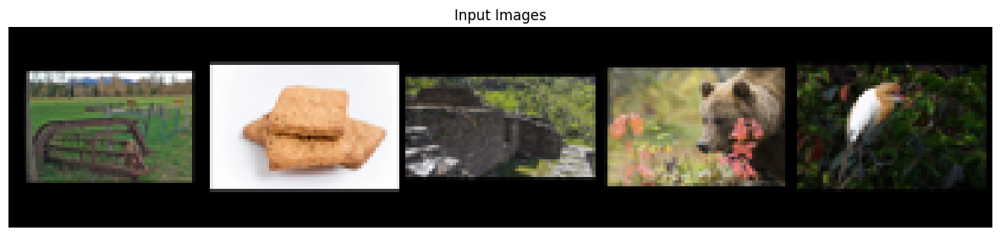

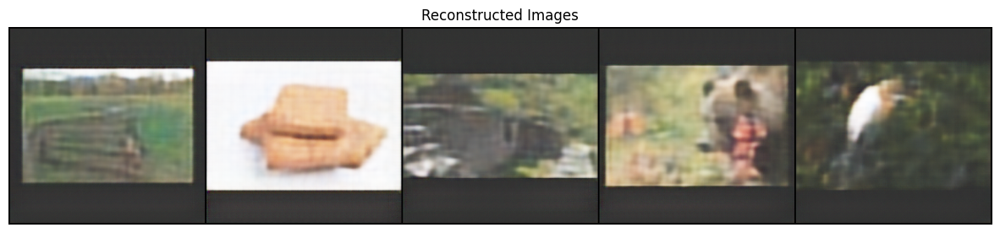

In [11]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.0005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

## Experiment 10

In [16]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=7, stride=1, padding=3),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 32x32
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            # nn.Conv2d(64, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 16, kernel_size=5, stride=1, padding=3),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 3, kernel_size=7, stride=1, padding=2),
            nn.Tanh()
        )

        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v10.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 403 K 
1 | decoder   | Sequential | 402 K 
2 | criterion | MSELoss    | 0     
-----------------------------------------
806 K     Trainable params
0         Non-trainable params
806 K     Total params
3.227     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]                                
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]           2,368
       BatchNorm2d-2         [-1, 16, 128, 128]              32
         LeakyReLU-3         [-1, 16, 128, 128]               0
            Conv2d-4         [-1, 32, 128, 128]          12,832
       BatchNorm2d-5         [-1, 32, 128, 128]              64
         LeakyReLU-6         [-1, 32, 128, 128]               0
         MaxPool2d-7           [-1, 32, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          18,496
       BatchNorm2d-9           [-1, 64, 64, 64]             128
        LeakyReLU-10           [-1, 64, 64, 64]               0
           Conv2d-11          [-1, 128, 64, 64]          73,856
      BatchNorm2d-12          [-1, 128, 64, 64]             256
        LeakyReLU-13       

Metric val/loss improved. New best score: 0.015


Epoch 1: 100%|██████████| 67/67 [00:32<00:00,  2.07it/s, v_num=49, train/loss_step=0.00979, val/loss_step=0.0118, val/loss_epoch=0.0113, train/loss_epoch=0.0132]

Metric val/loss improved by 0.003 >= min_delta = 0.0005. New best score: 0.011


Epoch 2: 100%|██████████| 67/67 [00:32<00:00,  2.05it/s, v_num=49, train/loss_step=0.0123, val/loss_step=0.0101, val/loss_epoch=0.00977, train/loss_epoch=0.0112]

Metric val/loss improved by 0.002 >= min_delta = 0.0005. New best score: 0.010


Epoch 4: 100%|██████████| 67/67 [00:32<00:00,  2.04it/s, v_num=49, train/loss_step=0.0138, val/loss_step=0.00895, val/loss_epoch=0.00863, train/loss_epoch=0.00961]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.009


Epoch 5: 100%|██████████| 67/67 [00:32<00:00,  2.05it/s, v_num=49, train/loss_step=0.00806, val/loss_step=0.00829, val/loss_epoch=0.00808, train/loss_epoch=0.0093] 

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.008


Epoch 10: 100%|██████████| 67/67 [00:32<00:00,  2.03it/s, v_num=49, train/loss_step=0.00756, val/loss_step=0.00752, val/loss_epoch=0.00736, train/loss_epoch=0.00794]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.007


Epoch 15: 100%|██████████| 67/67 [00:33<00:00,  2.03it/s, v_num=49, train/loss_step=0.00915, val/loss_step=0.00687, val/loss_epoch=0.00679, train/loss_epoch=0.00733]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.007


Epoch 22: 100%|██████████| 67/67 [00:33<00:00,  2.02it/s, v_num=49, train/loss_step=0.00815, val/loss_step=0.00621, val/loss_epoch=0.00618, train/loss_epoch=0.00686]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.006


Epoch 32: 100%|██████████| 67/67 [00:34<00:00,  1.97it/s, v_num=49, train/loss_step=0.00722, val/loss_step=0.00581, val/loss_epoch=0.00582, train/loss_epoch=0.00635]

Monitored metric val/loss did not improve in the last 10 records. Best score: 0.006. Signaling Trainer to stop.


Epoch 32: 100%|██████████| 67/67 [00:34<00:00,  1.96it/s, v_num=49, train/loss_step=0.00722, val/loss_step=0.00581, val/loss_epoch=0.00582, train/loss_epoch=0.00635]


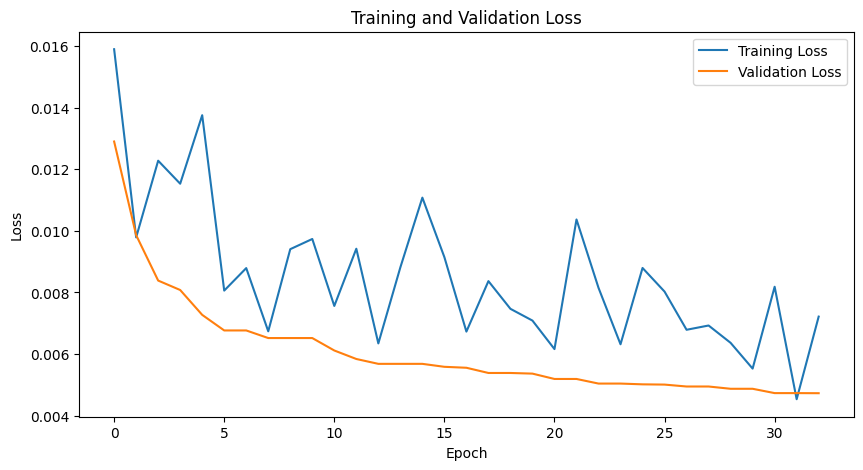

Average PSNR between Sr and reconstructed images: 18.11 dB
Average SSIM between Sr and reconstructed images: 0.3165


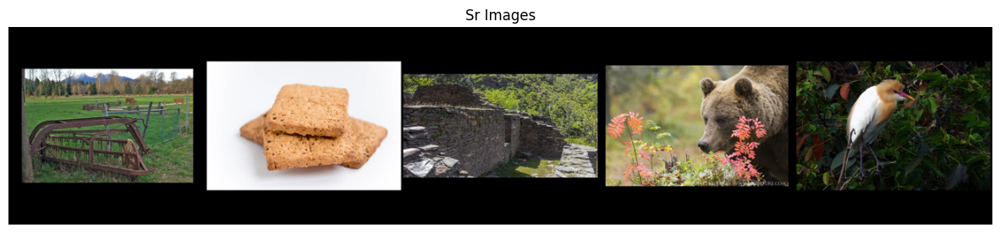

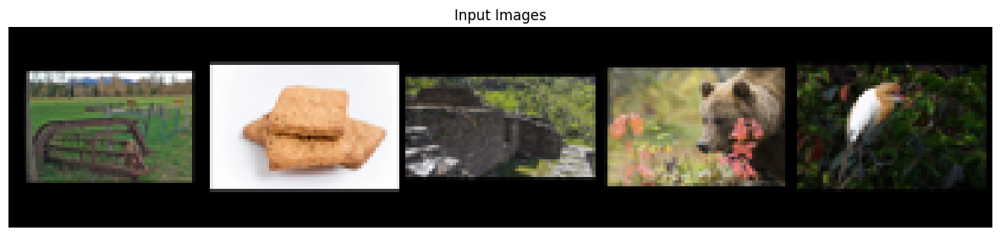

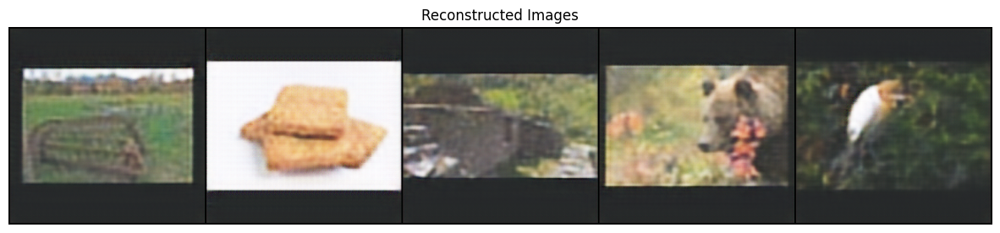

In [17]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.0005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

## Experiment 11

In [20]:
class SrConvAutoencoder(pl.LightningModule):
    def __init__(self):
        self.validation_results = {
            'original': [],
            'inputs': [],
            'outputs': []
        }
        self.train_step_losses = []
        self.val_step_losses = []
        self.train_losses = []
        self.val_losses = []

        super(SrConvAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=7, stride=1, padding=3),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),  # 64x64
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 16, kernel_size=5, stride=1, padding=3),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 3, kernel_size=7, stride=1, padding=2),
            nn.Tanh()
        )

        self.criterion = nn.MSELoss()

    def forward(self, x):
        code = self.encoder(x)
        reconstructed = self.decoder(code)
        return code, reconstructed

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x_lr, x_original = train_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('train/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.train_step_losses.append(loss.item())
        return loss

    def on_train_epoch_end(self):
        self.train_losses.append(self.train_step_losses[-1])

    def validation_step(self, val_batch, batch_idx):
        x_lr, x_original = val_batch
        _, reconstructed = self.forward(x_lr)
        loss = self.criterion(x_original, reconstructed)
        self.log('val/loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        self.val_step_losses.append(loss.item())

        self.validation_results['original'] = x_original
        self.validation_results['inputs'] = x_lr
        self.validation_results['outputs'] = reconstructed

        return loss

    def on_train_end(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses[1:], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        plt.show()

        torch.save(self.state_dict(), 'models/denoising_conv_autoencoder_v11.pth')

    def on_validation_epoch_end(self):
        self.val_losses.append(min(self.val_step_losses))
        
    def on_train_start(self):
        print()
        # Assicurati che il modello sia sulla CPU per il summary
        if torch.cuda.is_available():
            self.cuda()
        summary(self, (3, 128, 128))

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 403 K 
1 | decoder   | Sequential | 402 K 
2 | criterion | MSELoss    | 0     
-----------------------------------------
806 K     Trainable params
0         Non-trainable params
806 K     Total params
3.227     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]                                
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]           2,368
       BatchNorm2d-2         [-1, 16, 128, 128]              32
         LeakyReLU-3         [-1, 16, 128, 128]               0
            Conv2d-4         [-1, 32, 128, 128]          12,832
       BatchNorm2d-5         [-1, 32, 128, 128]              64
         LeakyReLU-6         [-1, 32, 128, 128]               0
            Conv2d-7         [-1, 64, 128, 128]          18,496
       BatchNorm2d-8         [-1, 64, 128, 128]             128
         LeakyReLU-9         [-1, 64, 128, 128]               0
           Conv2d-10        [-1, 128, 128, 128]          73,856
      BatchNorm2d-11        [-1, 128, 128, 128]             256
        LeakyReLU-12        [-1, 128, 128, 128]               0
        MaxPool2d-13       

Metric val/loss improved. New best score: 0.015


Epoch 1: 100%|██████████| 67/67 [00:35<00:00,  1.90it/s, v_num=51, train/loss_step=0.0126, val/loss_step=0.0118, val/loss_epoch=0.0112, train/loss_epoch=0.0133]

Metric val/loss improved by 0.004 >= min_delta = 0.0005. New best score: 0.011


Epoch 2: 100%|██████████| 67/67 [00:36<00:00,  1.86it/s, v_num=51, train/loss_step=0.0132, val/loss_step=0.0105, val/loss_epoch=0.00995, train/loss_epoch=0.0113]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.010


Epoch 3: 100%|██████████| 67/67 [00:36<00:00,  1.83it/s, v_num=51, train/loss_step=0.0134, val/loss_step=0.00969, val/loss_epoch=0.00926, train/loss_epoch=0.0102]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.009


Epoch 4: 100%|██████████| 67/67 [00:37<00:00,  1.78it/s, v_num=51, train/loss_step=0.00857, val/loss_step=0.00881, val/loss_epoch=0.00855, train/loss_epoch=0.00955]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.009


Epoch 6: 100%|██████████| 67/67 [00:43<00:00,  1.54it/s, v_num=51, train/loss_step=0.00788, val/loss_step=0.00799, val/loss_epoch=0.00782, train/loss_epoch=0.00836]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.008


Epoch 7: 100%|██████████| 67/67 [00:38<00:00,  1.74it/s, v_num=51, train/loss_step=0.00918, val/loss_step=0.00737, val/loss_epoch=0.00722, train/loss_epoch=0.00797]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.007


Epoch 13: 100%|██████████| 67/67 [00:36<00:00,  1.82it/s, v_num=51, train/loss_step=0.00732, val/loss_step=0.00642, val/loss_epoch=0.00635, train/loss_epoch=0.00717]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.006


Epoch 20: 100%|██████████| 67/67 [00:36<00:00,  1.82it/s, v_num=51, train/loss_step=0.00659, val/loss_step=0.00583, val/loss_epoch=0.00581, train/loss_epoch=0.00644]

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.006


Epoch 30: 100%|██████████| 67/67 [00:37<00:00,  1.80it/s, v_num=51, train/loss_step=0.0067, val/loss_step=0.0053, val/loss_epoch=0.00529, train/loss_epoch=0.0059]   

Metric val/loss improved by 0.001 >= min_delta = 0.0005. New best score: 0.005


Epoch 40: 100%|██████████| 67/67 [00:38<00:00,  1.75it/s, v_num=51, train/loss_step=0.00466, val/loss_step=0.00507, val/loss_epoch=0.00506, train/loss_epoch=0.00547]

Monitored metric val/loss did not improve in the last 10 records. Best score: 0.005. Signaling Trainer to stop.


Epoch 40: 100%|██████████| 67/67 [00:38<00:00,  1.75it/s, v_num=51, train/loss_step=0.00466, val/loss_step=0.00507, val/loss_epoch=0.00506, train/loss_epoch=0.00547]


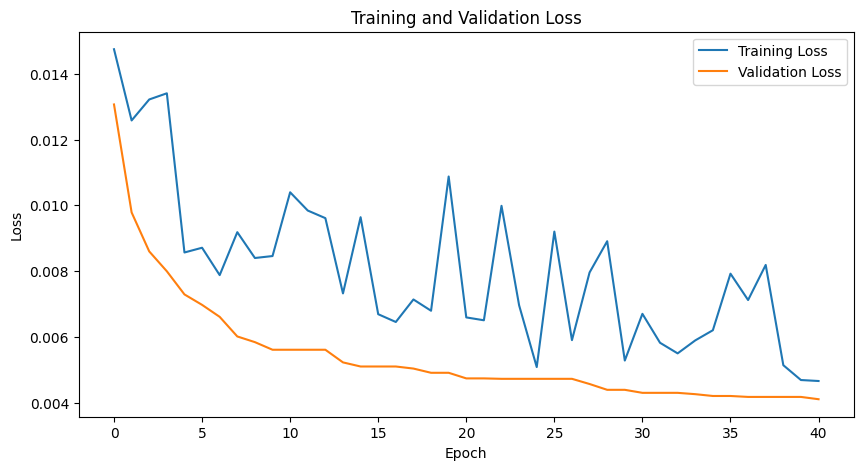

Average PSNR between Sr and reconstructed images: 18.17 dB
Average SSIM between Sr and reconstructed images: 0.3330


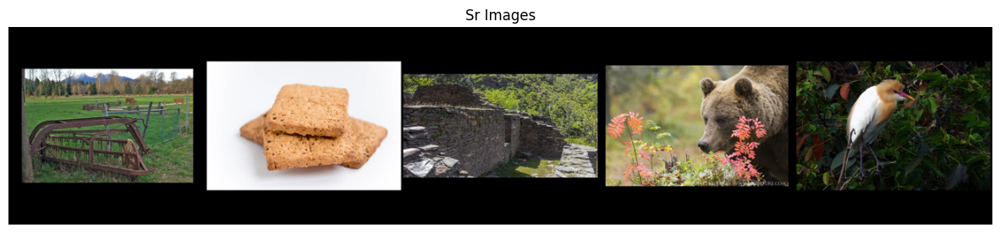

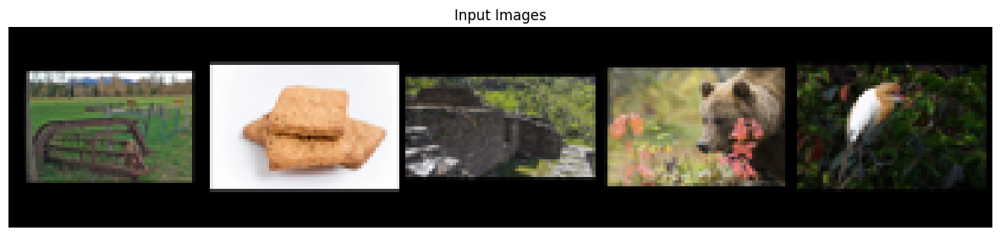

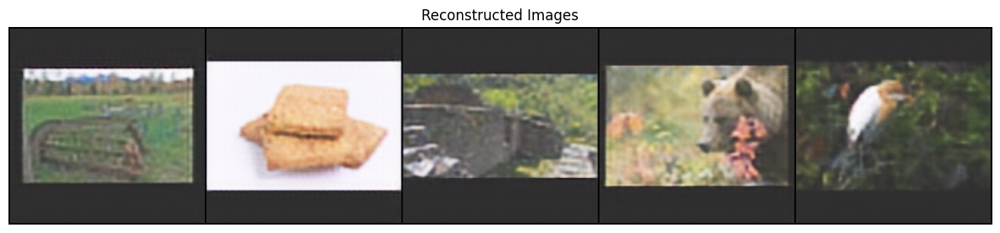

In [21]:
autoencoder = SrConvAutoencoder()

early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.0005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 403 K 
1 | decoder   | Sequential | 402 K 
2 | criterion | MSELoss    | 0     
-----------------------------------------
806 K     Trainable params
0         Non-trainable params
806 K     Total params
3.227     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]                                
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]           2,368
       BatchNorm2d-2         [-1, 16, 128, 128]              32
         LeakyReLU-3         [-1, 16, 128, 128]               0
            Conv2d-4         [-1, 32, 128, 128]          12,832
       BatchNorm2d-5         [-1, 32, 128, 128]              64
         LeakyReLU-6         [-1, 32, 128, 128]               0
            Conv2d-7         [-1, 64, 128, 128]          18,496
       BatchNorm2d-8         [-1, 64, 128, 128]             128
         LeakyReLU-9         [-1, 64, 128, 128]               0
           Conv2d-10        [-1, 128, 128, 128]          73,856
      BatchNorm2d-11        [-1, 128, 128, 128]             256
        LeakyReLU-12        [-1, 128, 128, 128]               0
        MaxPool2d-13       

Metric val/loss improved. New best score: 0.005


Epoch 1: 100%|██████████| 67/67 [00:35<00:00,  1.88it/s, v_num=53, train/loss_step=0.00661, val/loss_step=0.005, val/loss_epoch=0.005, train/loss_epoch=0.00556]   

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 4: 100%|██████████| 67/67 [00:35<00:00,  1.87it/s, v_num=53, train/loss_step=0.00497, val/loss_step=0.00492, val/loss_epoch=0.00493, train/loss_epoch=0.00532]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 7: 100%|██████████| 67/67 [00:35<00:00,  1.88it/s, v_num=53, train/loss_step=0.00429, val/loss_step=0.00485, val/loss_epoch=0.00485, train/loss_epoch=0.00536]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 11: 100%|██████████| 67/67 [00:36<00:00,  1.85it/s, v_num=53, train/loss_step=0.00454, val/loss_step=0.00472, val/loss_epoch=0.00473, train/loss_epoch=0.00517]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 18: 100%|██████████| 67/67 [00:44<00:00,  1.49it/s, v_num=53, train/loss_step=0.00658, val/loss_step=0.00464, val/loss_epoch=0.00465, train/loss_epoch=0.00517]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 25: 100%|██████████| 67/67 [00:37<00:00,  1.78it/s, v_num=53, train/loss_step=0.0042, val/loss_step=0.00459, val/loss_epoch=0.00459, train/loss_epoch=0.00504] 

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 31: 100%|██████████| 67/67 [00:37<00:00,  1.77it/s, v_num=53, train/loss_step=0.00439, val/loss_step=0.00451, val/loss_epoch=0.00453, train/loss_epoch=0.00488]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.005


Epoch 38: 100%|██████████| 67/67 [00:37<00:00,  1.77it/s, v_num=53, train/loss_step=0.00589, val/loss_step=0.00438, val/loss_epoch=0.00442, train/loss_epoch=0.00481]

Metric val/loss improved by 0.000 >= min_delta = 5e-05. New best score: 0.004


Epoch 48: 100%|██████████| 67/67 [00:38<00:00,  1.73it/s, v_num=53, train/loss_step=0.00381, val/loss_step=0.00445, val/loss_epoch=0.00447, train/loss_epoch=0.0047] 

Monitored metric val/loss did not improve in the last 10 records. Best score: 0.004. Signaling Trainer to stop.


Epoch 48: 100%|██████████| 67/67 [00:38<00:00,  1.73it/s, v_num=53, train/loss_step=0.00381, val/loss_step=0.00445, val/loss_epoch=0.00447, train/loss_epoch=0.0047]


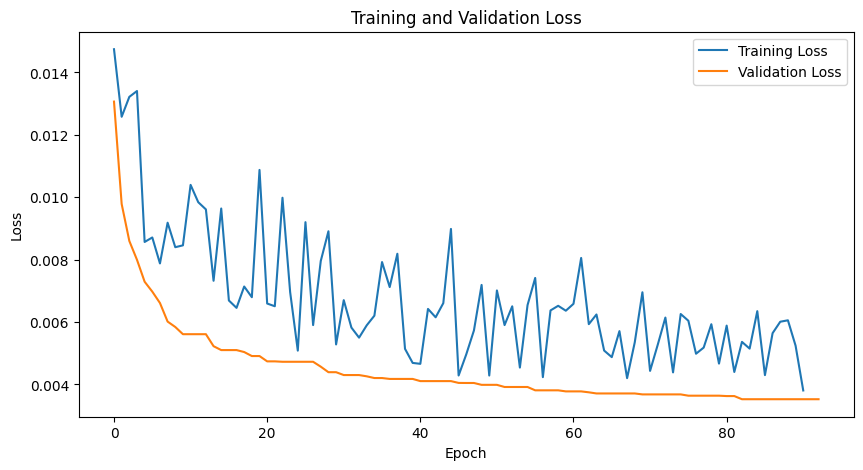

Average PSNR between Sr and reconstructed images: 18.97 dB
Average SSIM between Sr and reconstructed images: 0.3549


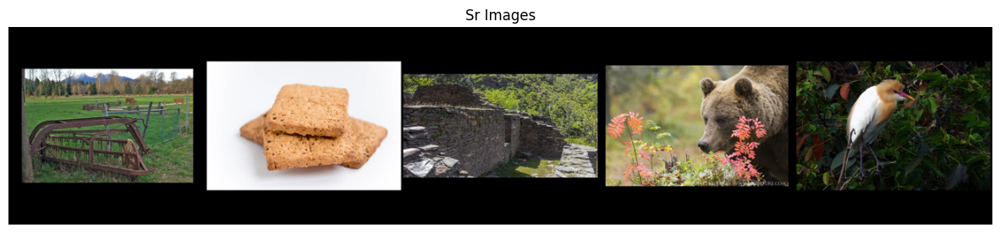

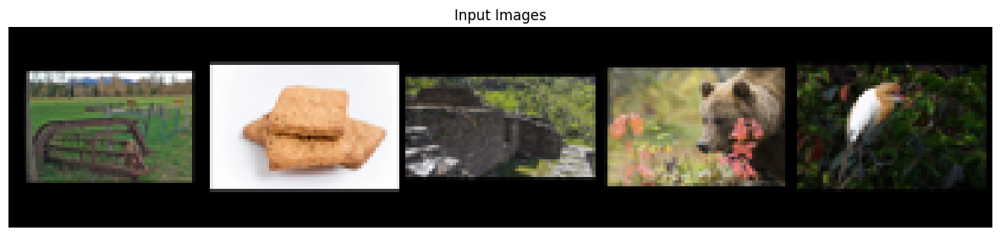

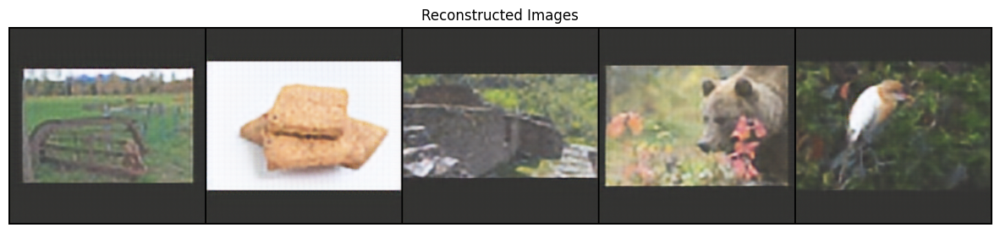

In [23]:
early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.00005
)

trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 403 K 
1 | decoder   | Sequential | 402 K 
2 | criterion | MSELoss    | 0     
-----------------------------------------
806 K     Trainable params
0         Non-trainable params
806 K     Total params
3.227     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]                                
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]           2,368
       BatchNorm2d-2         [-1, 16, 128, 128]              32
         LeakyReLU-3         [-1, 16, 128, 128]               0
            Conv2d-4         [-1, 32, 128, 128]          12,832
       BatchNorm2d-5         [-1, 32, 128, 128]              64
         LeakyReLU-6         [-1, 32, 128, 128]               0
            Conv2d-7         [-1, 64, 128, 128]          18,496
       BatchNorm2d-8         [-1, 64, 128, 128]             128
         LeakyReLU-9         [-1, 64, 128, 128]               0
           Conv2d-10        [-1, 128, 128, 128]          73,856
      BatchNorm2d-11        [-1, 128, 128, 128]             256
        LeakyReLU-12        [-1, 128, 128, 128]               0
        MaxPool2d-13       

Metric val/loss improved. New best score: 0.004


Epoch 10: 100%|██████████| 67/67 [00:36<00:00,  1.86it/s, v_num=54, train/loss_step=0.00488, val/loss_step=0.00439, val/loss_epoch=0.00443, train/loss_epoch=0.00468]

Monitored metric val/loss did not improve in the last 10 records. Best score: 0.004. Signaling Trainer to stop.


Epoch 10: 100%|██████████| 67/67 [00:36<00:00,  1.85it/s, v_num=54, train/loss_step=0.00488, val/loss_step=0.00439, val/loss_epoch=0.00443, train/loss_epoch=0.00468]


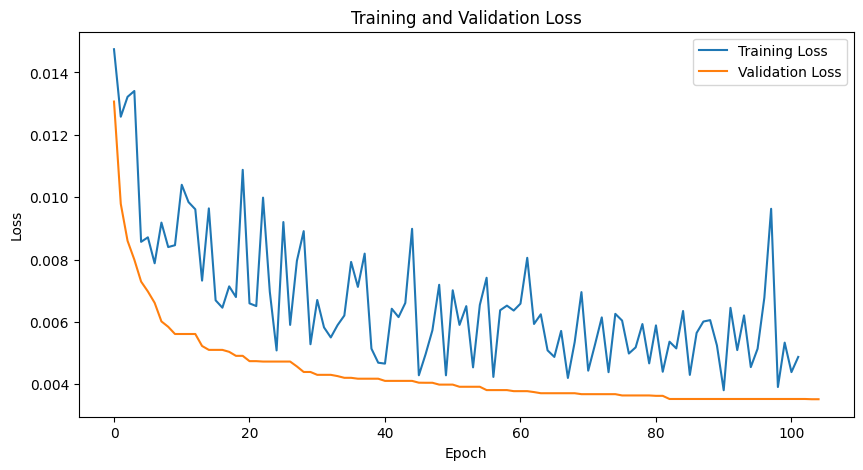

Average PSNR between Sr and reconstructed images: 19.40 dB
Average SSIM between Sr and reconstructed images: 0.3609


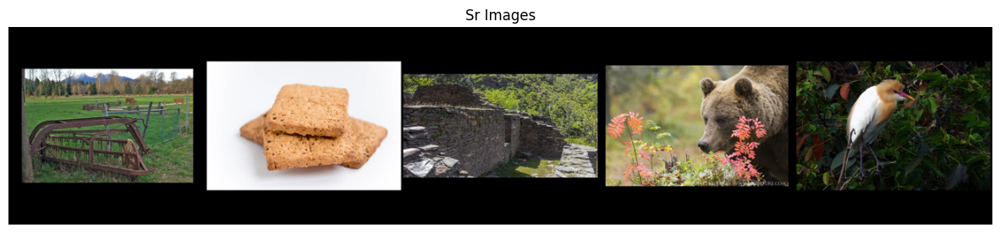

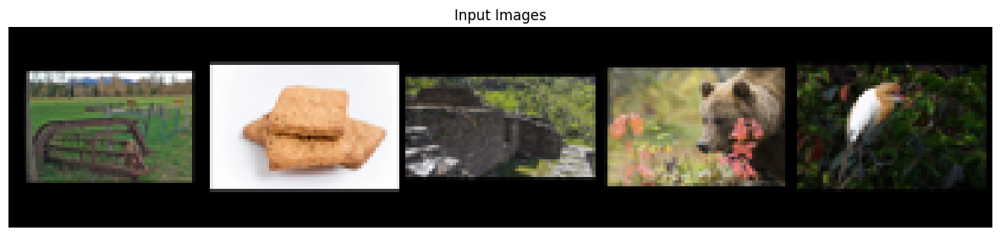

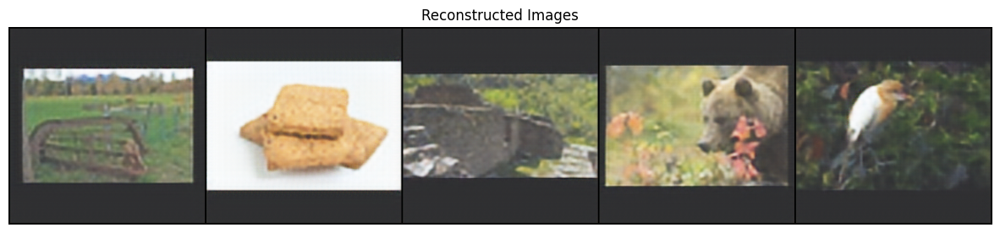

In [24]:
early_stopping = EarlyStopping(
    monitor='val/loss',  # Metrius per monitorare
    patience=10,  # Numero di epoch senza miglioramenti dopo i quali fermare il training
    verbose=True,
    mode='min',  # 'min' per fermare quando la metrica smette di diminuire, 'max' per fermare quando smette di aumentare,
    min_delta=0.00005
)

trainer = pl.Trainer(
    max_epochs=100,
    callbacks=[early_stopping]
)

trainer.fit(autoencoder, train_dataloader, val_dataloader)

show_images(autoencoder,original_size,scaled_size)